# Load Dataset

In [1]:
!pip install gdown

In [2]:
import gdown

# Replace with your actual shared link
url = 'https://drive.google.com/uc?id=1-3tSNakO2xfVU9k-ViJICE6BP6fgQZnX'
output = 'final_Audio_dataset.csv'
gdown.download(url, output, quiet=False)


Downloading...
From: https://drive.google.com/uc?id=1-3tSNakO2xfVU9k-ViJICE6BP6fgQZnX
To: /content/final_Audio_dataset.csv
100%|██████████| 9.99M/9.99M [00:00<00:00, 72.9MB/s]


'final_Audio_dataset.csv'

### Load the dataset from a CSV file and Create DataFrame
Print the first few rows of the DataFrame to quickly inspect the data

In [3]:
import pandas as pd

# Load the downloaded CSV file
data = pd.read_csv(output)
print("Loaded Data:")
data.head()

Loaded Data:


,filename,label,student_id,Mfcc_1,Mfcc_2,Mfcc_3,Mfcc_4,Mfcc_5,Mfcc_6,Mfcc_7,...,Spectral_Contrast_2,Spectral_Contrast_3,Spectral_Contrast_4,Spectral_Contrast_5,Spectral_Contrast_6,Spectral_Contrast_7,Zero_Crossing_Rate,RMS_Energy,Spectral_Centroid,Spectral_Bandwidth
0,HW1_Q5_810801072_Male.mp3_0,male,810801072,-155.217852,135.871079,-13.262353,47.794728,7.207893,7.300228,-22.951777,...,15.134972,17.070269,14.433772,17.228962,18.581393,58.160648,0.047679,[0.23225176],1229.271846,1533.279825
1,HW1_Q5_810801072_Male.mp3_1,male,810801072,-177.114558,140.304623,-21.115352,46.488005,-3.399340,16.619354,-25.741743,...,14.806266,16.118720,14.425761,16.752967,18.602274,60.356715,0.059593,[0.14712484],1343.079574,1608.519421
2,HW1_Q5_810801072_Male.mp3_2,male,810801072,-162.584909,120.209218,-14.282396,57.224400,-7.945799,16.344686,-23.463047,...,15.976979,15.895401,14.369768,16.341339,18.345921,63.918985,0.086666,[0.17661643],1617.971710,1646.950283
3,HW1_Q5_810801072_Male.mp3_3,male,810801072,-165.845303,145.862184,-10.069458,37.615732,-4.063423,11.771095,-19.396108,...,17.257902,16.087427,14.417355,16.030734,18.538016,60.833595,0.049463,[0.21423991],1202.299332,1526.762868
4,HW1_Q5_810801072_Male.mp3_4,male,810801072,-178.106893,132.620852,-11.592609,59.768651,1.988449,9.041938,-14.379663,...,16.781561,17.587037,13.861953,15.965217,18.759575,59.502767,0.043889,[0.20913659],1188.361837,1551.776937


Initially, the values in the RMS_Energy column are stored as strings, and they contain square brackets. This format is not suitable for numerical analysis, and hence, we need to clean and convert the data.

In [4]:
data['RMS_Energy'] = data['RMS_Energy'].astype(str).str.replace('[', '', regex=False).str.replace(']', '', regex=False).astype(float)

# Utills
Required Functions


---



###   **K_fold_Crossvalidation Function**:  

---



  *  This function provides an efficient way to compare classification models and evaluate various features and feature reduction techniques.

  *   Using the KFold class from sklearn.model_selection, the data is split into k folds (default is 5). This ensures that each fold is used as a test set once, and as part of the training set k-1 times.

  *   Standard scaling is applied to the feature sets using StandardScaler to normalize the data
  *   If a feature reduction function is provided, we fit it using the training data and then apply it to the test data. This step ensures that the feature reduction technique is appropriately trained on the training set before being applied to unseen test data.
  *  The average accuracy score across all folds are calculated to provide an overall performance metric. Additionally, the average confusion matrix is plotted to visualize the performance.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import KFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

def k_fold_cross_validation(df, feature_names, target_name, model, feature_reduction_func, k=5):
    """
    Perform k-fold cross-validation on the given data.

    Parameters:
    df (pd.DataFrame): The input data frame.
    feature_names (list): List of feature column names.
    target_name (str): The name of the target column.
    model: The classification model to be used.
    feature_reduction_func: The feature reduction function to be applied.
    k (int): The number of folds for cross-validation (default is 5).

    Returns:
    float: The average accuracy score across all folds.
    """
    X = df[feature_names]
    y = df[target_name]

    kf = KFold(n_splits=k, shuffle=True, random_state=42)
    accuracies = []
    confusion_matrices = []

    for train_index, test_index in kf.split(X):
        X_train, X_test = X.iloc[train_index], X.iloc[test_index]
        y_train, y_test = y.iloc[train_index], y.iloc[test_index]

        # Feature scaling
        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        # Feature reduction
        if(feature_reduction_func):
          X_train_scaled = feature_reduction_func.fit_transform(X_train_scaled, y_train)
          X_test_scaled = feature_reduction_func.transform(X_test_scaled)


        model.fit(X_train_scaled, y_train)

        # Make predictions

        #test_accuracy = model.evaluate(X_test_scaled, y_test)
        y_pred = model.predict(X_test_scaled)

        # Calculate accuracy
        accuracy = accuracy_score(y_test, y_pred)
        accuracies.append(accuracy)

        # Generate confusion matrix
        conf_matrix = confusion_matrix(y_test, y_pred)
        confusion_matrices.append(conf_matrix)

    # Calculate average accuracy
    avg_accuracy = np.mean(accuracies)*100
    std_accuracy = np.std(accuracies)*100

    # Plot the average confusion matrix
    avg_conf_matrix = np.mean(confusion_matrices, axis=0)
    plt.figure(figsize=(5, 3))
    sns.heatmap(avg_conf_matrix, annot=True, fmt='.2f', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Average Confusion Matrix')
    plt.show()

    return avg_accuracy, std_accuracy


### **Visualization of Cross-Validation Results**
### **Plot_Results_Barchart**

---


To effectively compare the performance of various classification models and feature reduction techniques, we utilize a bar chart visualization. The Plot_Results_Barchart function is designed to generate and display these bar charts, providing clear and intuitive insights into the cross-validation results.

For each feature reduction method, the function filters the results and plots a bar chart showing the mean accuracy of different models for each feature set. The maximum accuracy for each feature reduction method is printed, and bars with the highest accuracy are highlighted with red edges.


In [ ]:
def Plot_Results_Barchart(results_df):

  # List of feature reduction methods
  feature_reductions = results_df['Feature Reduction'].unique()

  # Set a pleasing color palette
  sns.set_palette("Set2")

  # Loop to plot bar charts for each feature reduction method
  for reduction in feature_reductions:
      # Filter data for the current feature reduction method
      filtered_results = results_df[results_df['Feature Reduction'] == reduction]
      max_value = filtered_results['Mean Accuracy'].max()
      print(f"Maximum accuracy if feature reduction({reduction}): {max_value:.2f}%")

      # Plot the bar chart
      plt.figure(figsize=(7, 5))
      ax = sns.barplot(x='Feature Set', y='Mean Accuracy', hue='Model', data=filtered_results, errorbar=None, width=0.4)


      # Add solid lines around each bar
      for bar in ax.patches:
          if bar.get_height() == max_value:
              bar.set_edgecolor('red')
              bar.set_linewidth(2)
          else:
              bar.set_edgecolor('black')
              bar.set_linewidth(0.5)

      # Set titles and labels
      plt.title(f'Cross-Validation Mean Accuracy for Different Models ({reduction})', fontsize=10)
      plt.xlabel('Feature Set', fontsize=8)
      plt.ylabel('Mean Accuracy', fontsize=8)
      plt.ylim(0, 100)
      plt.xticks(fontsize=8)
      plt.yticks(fontsize=8)
      plt.legend(title='Model', loc='upper center', bbox_to_anchor=(0.5, -0.2), ncol=3, fontsize=8)

      plt.tight_layout()
      plt.show()


### **Classification Using Different Models, Feature Reduction, and Feature Sets**
### **Run_Classification**

---
The Run_Classification function is a comprehensive approach designed to evaluate the performance of various classification models using different feature sets and feature reduction techniques. This function leverages *k-fold cross-validation*(**k=4**) to provide robust performance metrics for each combination of model, feature set, and feature reduction method.
*   Various classification models are defined for evaluation:
  *   K-Nearest Neighbors (KNN)
  *   Logistic Regression
  *   Support Vector Machine (SVM)


*   Feature Reduction Techniques:
  *   Linear Discriminant Analysis (LDA)
  *   Principal Component Analysis (PCA)
  *   No feature reduction (None)

*   Defining Feature Sets:
  *   mfcc_features: Mel-Frequency Cepstral Coefficients (MFCC) features.
  *   spectral_contrast_features: Spectral Contrast features.
  *   combined_features: A combination of MFCC and Spectral Contrast features.
  *   time_features: Time-domain features such as Zero Crossing Rate and RMS Energy.
  *   Spec_cent_Bw: Spectral Centroid and Spectral Bandwidth features.
  *   all_features: A combination of all the above feature sets.

The results DataFrame, containing the performance metrics for each combination.


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC


from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

def Run_Classification(balanced_dataFrame):
  # Define the feature sets
  mfcc_features = [f'Mfcc_{i+1}' for i in range(13)]
  spectral_contrast_features = [f'Spectral_Contrast_{i+1}' for i in range(7)]
  combined_features = mfcc_features + spectral_contrast_features
  time_features = ['Zero_Crossing_Rate',	'RMS_Energy']
  Spec_cent_Bw = ['Spectral_Centroid',	'Spectral_Bandwidth']
  all_features = combined_features + time_features + Spec_cent_Bw

  balanced_dataFrame['RMS_Energy'] = balanced_dataFrame['RMS_Energy'].astype(str).str.replace('[', '', regex=False).str.replace(']', '', regex=False).astype(float)

  # Define the target column
  target_column = 'class'

  # Define the models
  models = {
      'KNN': KNeighborsClassifier(n_neighbors=5),
      'Logistic Regression': LogisticRegression( max_iter=200, random_state= 42),
      'SVM': SVC(kernel='linear', random_state=42)
  }

  # Define the feature sets
  feature_sets = {
      'time_domain_features' : time_features,
      'MFCC': mfcc_features,
      'Spectral Contrast': spectral_contrast_features,
      'MFCC&Sp_Contrast': combined_features,
      'Spec_Cent&BW': Spec_cent_Bw,
      'all_features' : all_features
  }

  feature_reductions = {
      'LDA': LinearDiscriminantAnalysis(),
      'PCA': PCA(),
      'None': None
  }

  # Run cross-validation and store results
  results = []
  for model_name, model in models.items():
      for feature_set_name, feature_columns in feature_sets.items():
          for reduction_name, reduction_func in feature_reductions.items():
              print(f'\nModel({model_name}) using feature({feature_set_name}) and feature reduction({reduction_name})\n')
              mean_accuracy, std_accuracy = k_fold_cross_validation(balanced_dataFrame, feature_columns, target_column, model, reduction_func, k=4)
              results.append({
                  'Model': model_name,
                  'Feature Set': feature_set_name,
                  'Feature Reduction': reduction_name,
                  'Mean Accuracy': mean_accuracy,
                  'Std Accuracy': std_accuracy
                  })

  results_df = pd.DataFrame(results)
  return results_df

# Random Student Set1
Select 6 random Student and Ensure each student has an equal number of samples and visualize some features using pairplots.

**Random Student Selection**: We begin by randomly selecting 6 students from the dataset. This ensures that our analysis is not biased towards any specific subset of students.

In [5]:
import random

random.seed(42)

# Get unique student IDs
student_ids = data['student_id'].unique()

# Randomly select 6 students
selected_students = random.sample(list(student_ids), 6)
print(f"Selected Students: {selected_students}")

Selected Students: [810103317, 810103092, 810102087, 810102029, 810103112, 810103093]


**Equal Number of Samples**: For each of the selected students, we ensure that an equal number of samples are used for further analysis. This step is crucial to maintain consistency and fairness in our analysis.

In [6]:
from sklearn.utils import shuffle

filtered_data = data[data['student_id'].isin(selected_students)]

# Ensure each student has an equal number of samples
balanced_data = filtered_data.groupby('student_id').apply(lambda x: x.sample(n=filtered_data['student_id'].value_counts().min(), random_state=42)).reset_index(drop=True)
balanced_data = shuffle(balanced_data, random_state=42)
balanced_data.reset_index(drop=True, inplace=True)

print("Number of samples for each student in the balanced DataFrame:")
print(balanced_data['student_id'].value_counts())

Number of samples for each student in the balanced DataFrame:
student_id
810103112    74
810102087    74
810102029    74
810103093    74
810103317    74
810103092    74
Name: count, dtype: int64


<ipython-input-6-bbe0c27d918c>:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  balanced_data = filtered_data.groupby('student_id').apply(lambda x: x.sample(n=filtered_data['student_id'].value_counts().min(), random_state=42)).reset_index(drop=True)


### **Pairplot Visualization**:
Pairplots are used to visualize the relationships between different features for the selected students. This provides an intuitive and visual understanding of the data distribution and correlations.

**MFCC features**

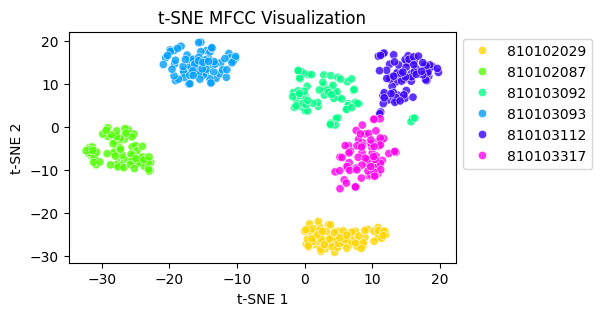

In [11]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.manifold import TSNE

mfcc_features = [f'Mfcc_{i+1}' for i in range(13)]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(balanced_data[mfcc_features])
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)
df_tsne = pd.DataFrame(X_tsne, columns=['X_tsne_1', 'X_tsne_2'])

# Add the cluster labels to the DataFrame
df_tsne['student_id'] = balanced_data['student_id'].copy()

import matplotlib.pyplot as plt
import seaborn as sns

# Create a scatter plot
plt.figure(figsize=(5, 3))
sns.scatterplot(
    x='X_tsne_1', y='X_tsne_2',
    hue='student_id',
    palette=sns.color_palette("hsv", len(df_tsne['student_id'].unique())),
    data=df_tsne,
    alpha=0.8
)

# Add titles and labels
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.title('t-SNE MFCC Visualization')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')

# Show the plot
plt.show()

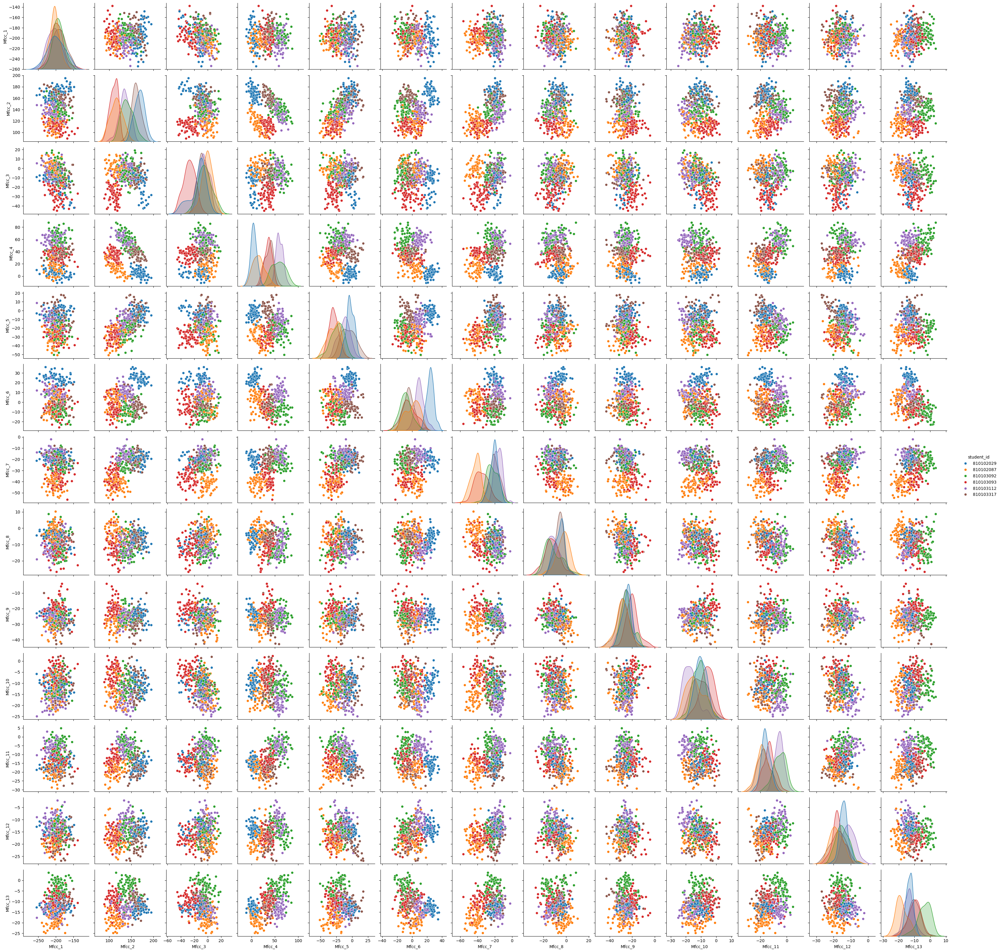

In [ ]:
import seaborn as sns


mfcc_features = [f'Mfcc_{i+1}' for i in range(13)]
# Plot pair plot
palette = sns.color_palette("tab10", balanced_data['student_id'].nunique())
sns.pairplot(balanced_data, hue='student_id', vars= mfcc_features, palette=palette)

# Display the plot
plt.show()


**Spectral_Contrast features**

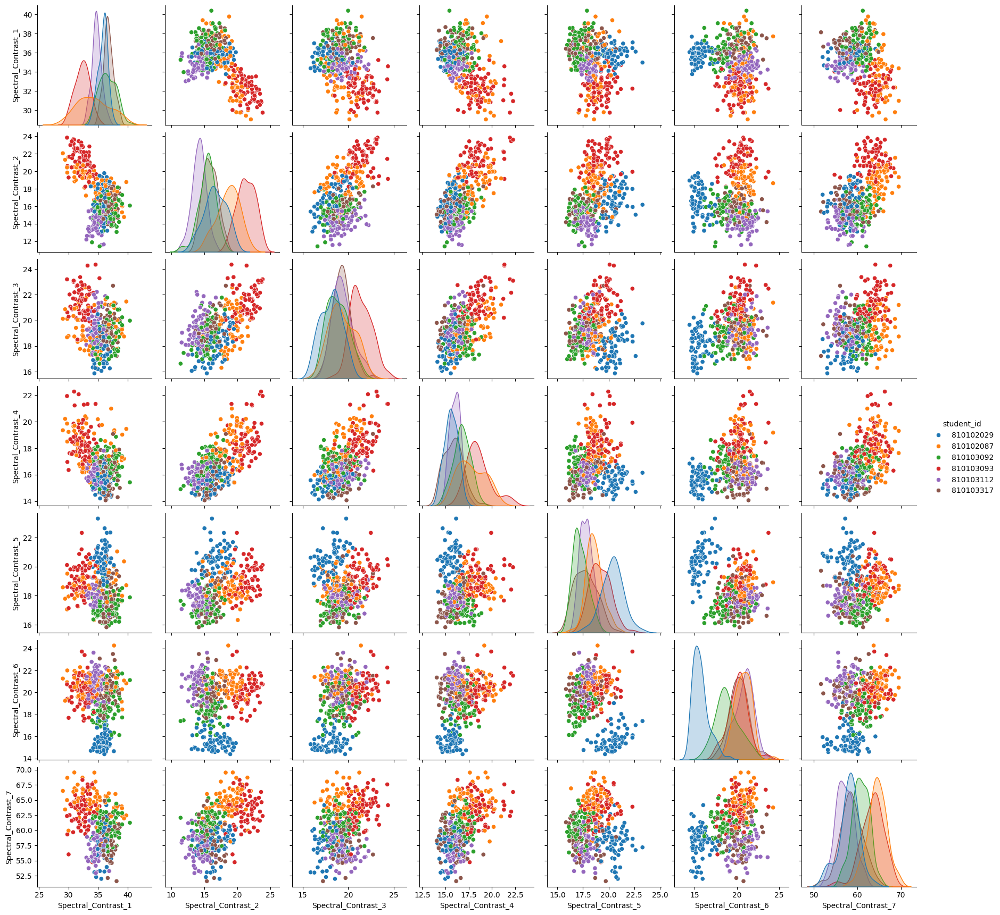

In [ ]:
import seaborn as sns

spectral_contrast_features = [f'Spectral_Contrast_{i+1}' for i in range(7)]
# Plot pair plot
palette = sns.color_palette("tab10", balanced_data['student_id'].nunique())
sns.pairplot(balanced_data, hue='student_id', vars= spectral_contrast_features, palette=palette)

# Display the plot
plt.show()

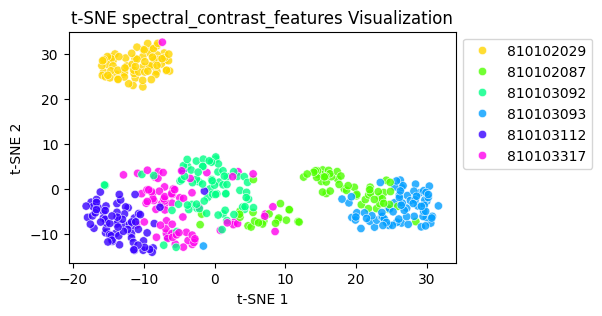

In [12]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.manifold import TSNE

spectral_contrast_features = [f'Spectral_Contrast_{i+1}' for i in range(7)]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(balanced_data[spectral_contrast_features])
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X_scaled)
df_tsne = pd.DataFrame(X_tsne, columns=['X_tsne_1', 'X_tsne_2'])

# Add the cluster labels to the DataFrame
df_tsne['student_id'] = balanced_data['student_id'].copy()

import matplotlib.pyplot as plt
import seaborn as sns

# Create a scatter plot
plt.figure(figsize=(5, 3))
sns.scatterplot(
    x='X_tsne_1', y='X_tsne_2',
    hue='student_id',
    palette=sns.color_palette("hsv", len(df_tsne['student_id'].unique())),
    data=df_tsne,
    alpha=0.8
)

# Add titles and labels
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.title('t-SNE spectral_contrast_features Visualization')
plt.xlabel('t-SNE 1')
plt.ylabel('t-SNE 2')

# Show the plot
plt.show()

**Time domain features**: Zero Crossing Rate and RMS Energy

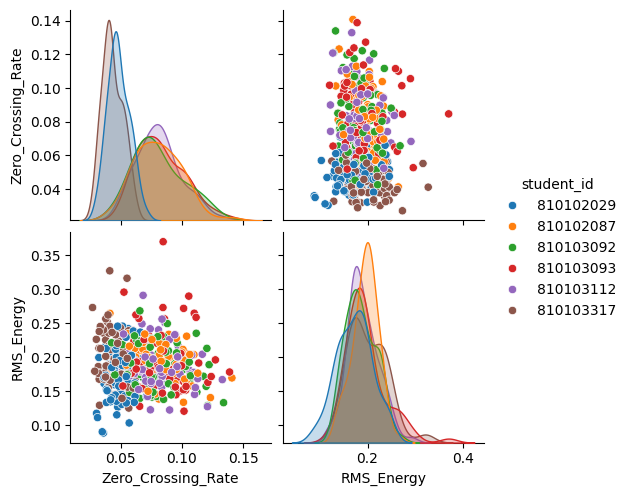

In [ ]:
import seaborn as sns

time_features = ['Zero_Crossing_Rate',	'RMS_Energy']
# Plot pair plot
palette = sns.color_palette("tab10", balanced_data['student_id'].nunique())
sns.pairplot(balanced_data, hue='student_id', vars= time_features, palette=palette)

# Display the plot
plt.show()

## **Classification and Analysis for Student Set1**

**Mapping Student IDs to Class Labels**: We create a mapping from student IDs to class labels. Each selected student is assigned a unique class label, starting from 0 up to the number of selected students minus one.

In [ ]:
# Map student IDs to class labels (e.g., 0 to 5)
class_mapping = {student_id: idx for idx, student_id in enumerate(selected_students)}
balanced_data['class'] = balanced_data['student_id'].map(class_mapping)


print("Balanced DataFrame with Class Column:")
balanced_data.tail()

Balanced DataFrame with Class Column:


,filename,label,student_id,Mfcc_1,Mfcc_2,Mfcc_3,Mfcc_4,Mfcc_5,Mfcc_6,Mfcc_7,...,Spectral_Contrast_3,Spectral_Contrast_4,Spectral_Contrast_5,Spectral_Contrast_6,Spectral_Contrast_7,Zero_Crossing_Rate,RMS_Energy,Spectral_Centroid,Spectral_Bandwidth,class
439,HW1.Q1.810102087_female.mp3_1,female,810102087,-211.529116,101.761168,0.209995,16.871174,-48.332444,4.693848,-36.211554,...,18.743265,19.309375,18.688419,21.349899,69.546509,0.112920,0.176405,1911.416445,1928.013364,2
440,HW1_Q5_810103093_female.mp3_52,female,810103093,-191.973185,103.741821,-24.087475,44.448128,-40.751262,-18.416365,-37.464579,...,20.205270,21.290648,17.665743,20.465195,63.403702,0.113662,0.191328,1824.509479,1623.199300,5
441,HW1_Q6_810103112_male.mp3_28,male,810103112,-200.685520,140.967915,-7.157591,54.060412,-20.910681,7.706051,-15.340410,...,18.227707,16.766824,17.878933,21.506021,56.032859,0.081817,0.182989,1394.534018,1386.394595,4
442,HW1_Q5_810103317_male.mp3_56,male,810103317,-192.248619,171.752012,4.759336,28.536001,-0.811559,-1.938769,-20.755198,...,19.830344,16.554514,17.852457,19.682045,58.222597,0.039667,0.262232,858.368778,1160.302661,0
443,HW1.Q1j.810102087_female.mp3_8,female,810102087,-187.428033,119.058882,-7.750454,7.601307,-32.171023,9.521086,-52.738433,...,19.683765,17.402643,19.599180,21.998740,66.103965,0.106383,0.203964,1782.128366,1785.368514,2


### Classification Process and Average Confusion Matrix

#### **Calling the Classification Function**
The *Run_Classification* function is called with the balanced dataset (balanced_data) as its input. This function performs k-fold cross-validation for various combinations of classification models, feature sets, and feature reduction techniques.
The *Result_DF* DataFrame now contains detailed performance metrics for various combinations of models, feature sets, and feature reduction techniques. This structured summary facilitates easy comparison and selection of the most effective approaches for the classification task.


Model(KNN) using feature(time_domain_features) and feature reduction(LDA)



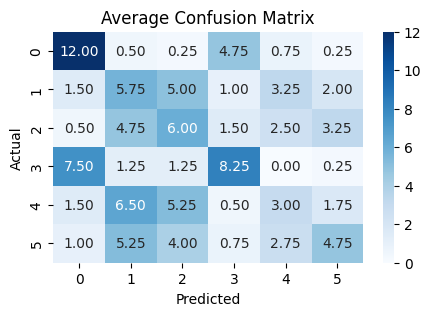


Model(KNN) using feature(time_domain_features) and feature reduction(PCA)



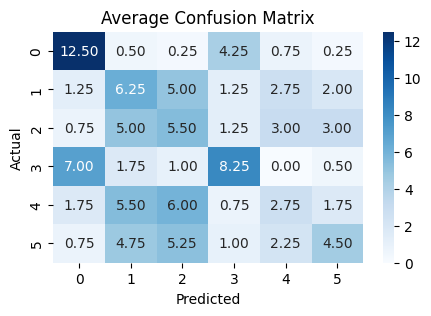


Model(KNN) using feature(time_domain_features) and feature reduction(None)



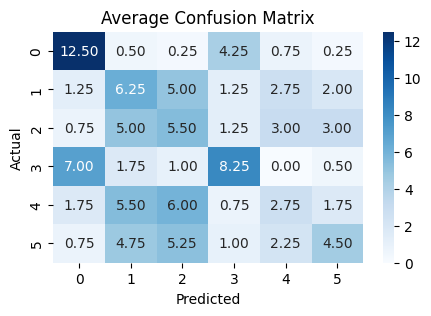


Model(KNN) using feature(MFCC) and feature reduction(LDA)



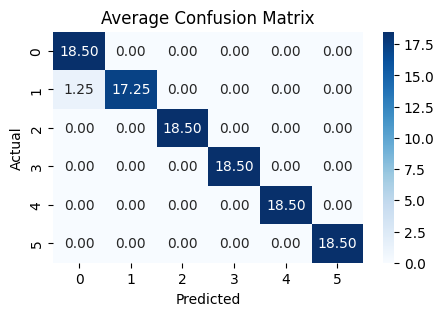


Model(KNN) using feature(MFCC) and feature reduction(PCA)



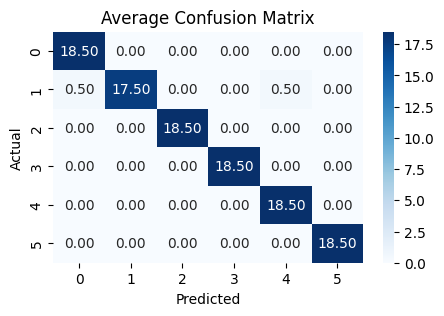


Model(KNN) using feature(MFCC) and feature reduction(None)



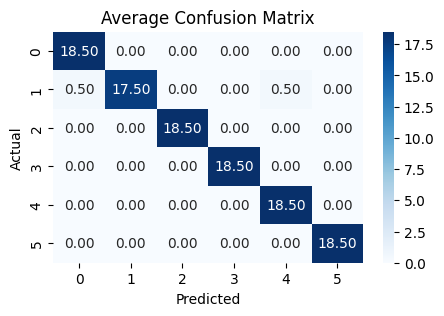


Model(KNN) using feature(Spectral Contrast) and feature reduction(LDA)



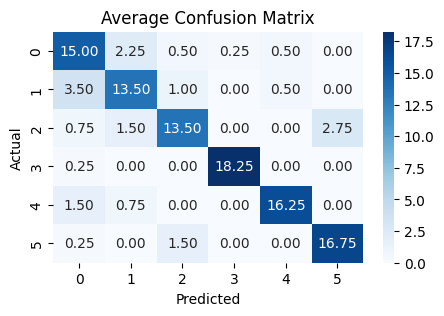


Model(KNN) using feature(Spectral Contrast) and feature reduction(PCA)



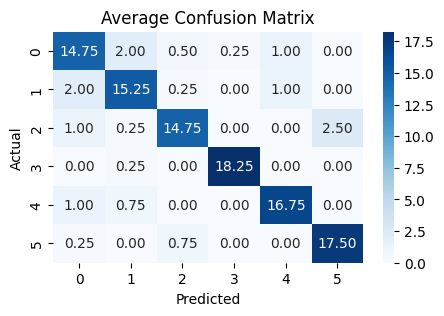


Model(KNN) using feature(Spectral Contrast) and feature reduction(None)



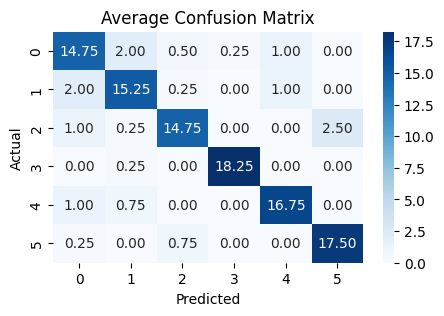


Model(KNN) using feature(MFCC&Sp_Contrast) and feature reduction(LDA)



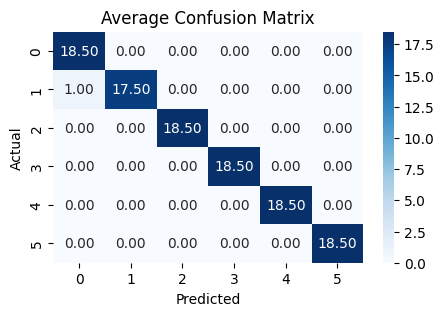


Model(KNN) using feature(MFCC&Sp_Contrast) and feature reduction(PCA)



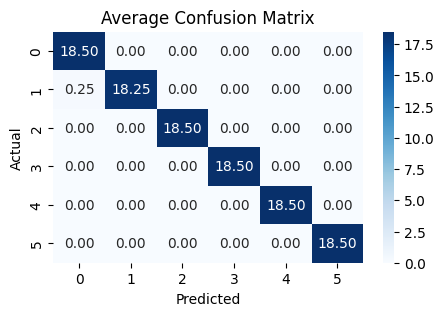


Model(KNN) using feature(MFCC&Sp_Contrast) and feature reduction(None)



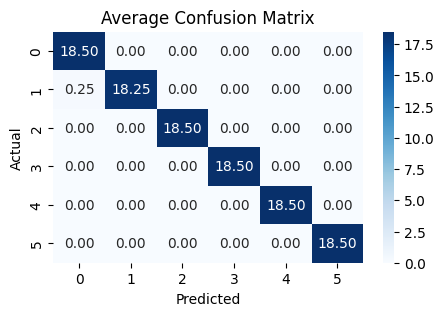


Model(KNN) using feature(Spec_Cent&BW) and feature reduction(LDA)



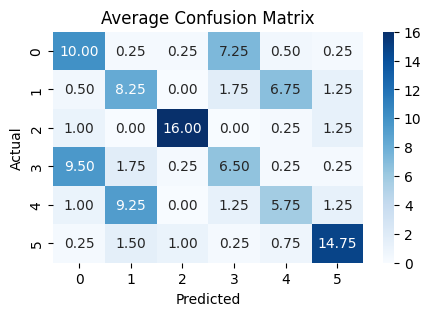


Model(KNN) using feature(Spec_Cent&BW) and feature reduction(PCA)



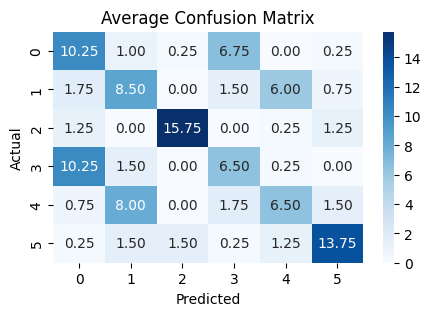


Model(KNN) using feature(Spec_Cent&BW) and feature reduction(None)



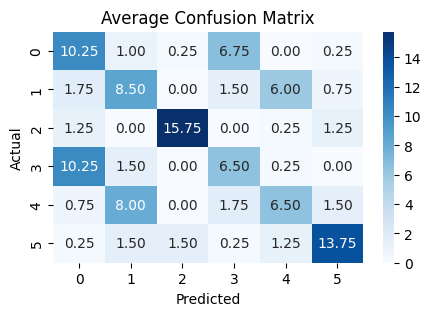


Model(KNN) using feature(all_features) and feature reduction(LDA)



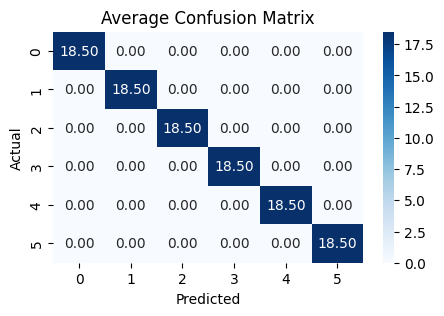


Model(KNN) using feature(all_features) and feature reduction(PCA)



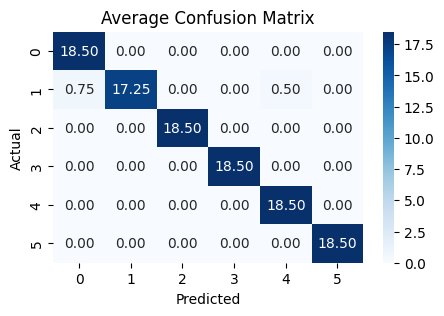


Model(KNN) using feature(all_features) and feature reduction(None)



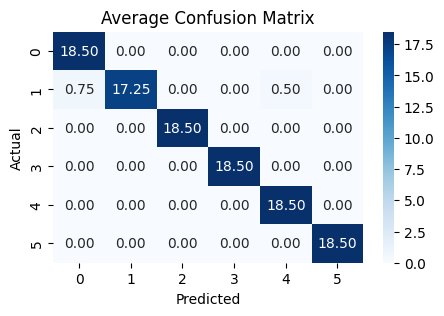


Model(Logistic Regression) using feature(time_domain_features) and feature reduction(LDA)



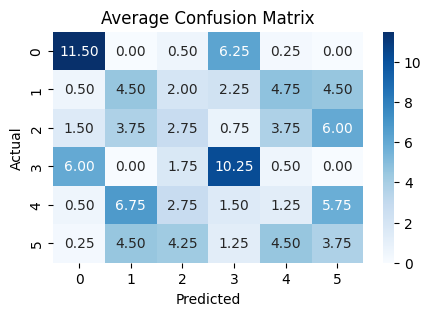


Model(Logistic Regression) using feature(time_domain_features) and feature reduction(PCA)



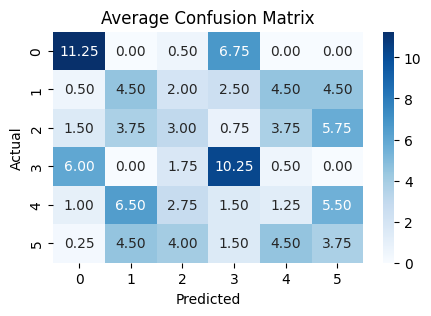


Model(Logistic Regression) using feature(time_domain_features) and feature reduction(None)



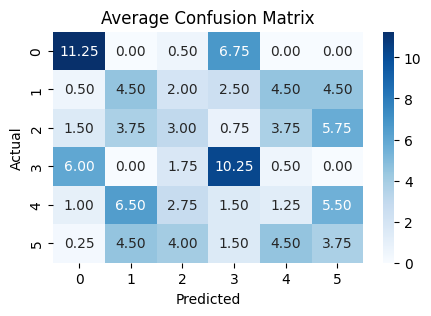


Model(Logistic Regression) using feature(MFCC) and feature reduction(LDA)



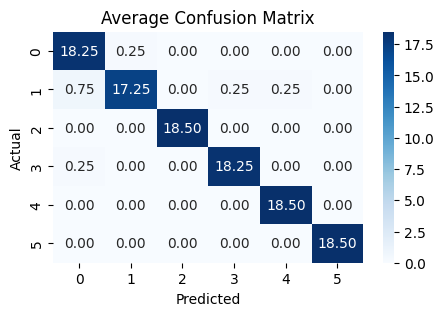


Model(Logistic Regression) using feature(MFCC) and feature reduction(PCA)



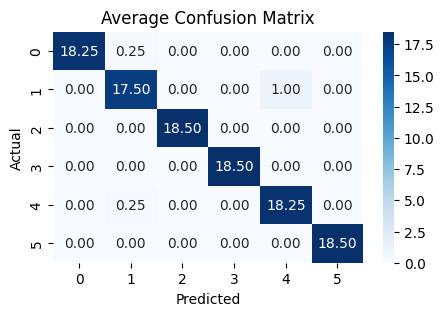


Model(Logistic Regression) using feature(MFCC) and feature reduction(None)



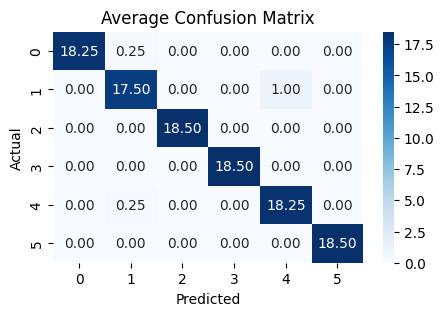


Model(Logistic Regression) using feature(Spectral Contrast) and feature reduction(LDA)



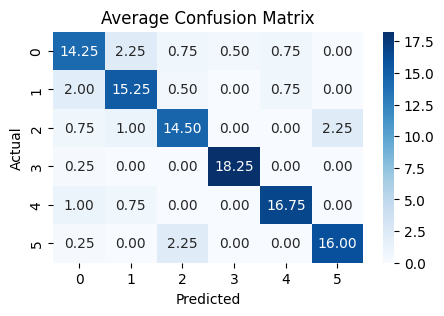


Model(Logistic Regression) using feature(Spectral Contrast) and feature reduction(PCA)



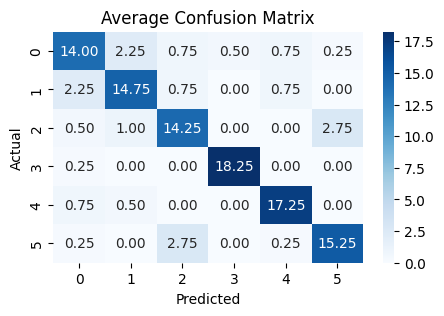


Model(Logistic Regression) using feature(Spectral Contrast) and feature reduction(None)



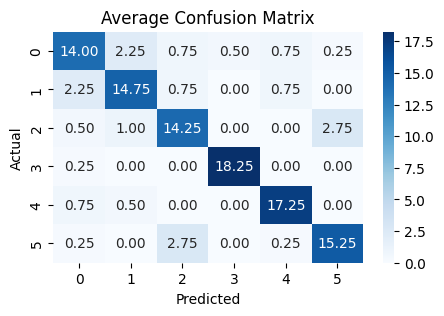


Model(Logistic Regression) using feature(MFCC&Sp_Contrast) and feature reduction(LDA)



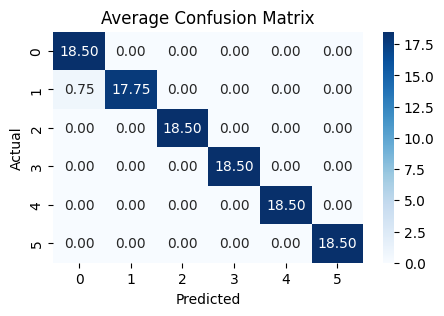


Model(Logistic Regression) using feature(MFCC&Sp_Contrast) and feature reduction(PCA)



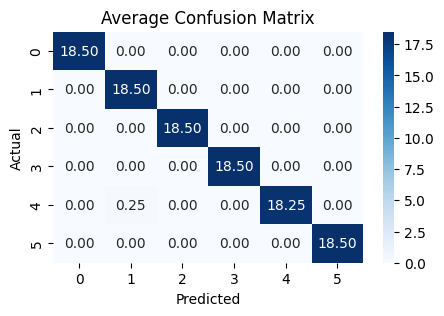


Model(Logistic Regression) using feature(MFCC&Sp_Contrast) and feature reduction(None)



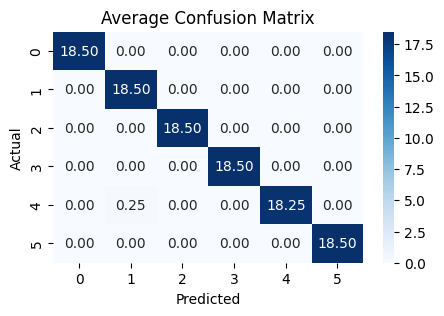


Model(Logistic Regression) using feature(Spec_Cent&BW) and feature reduction(LDA)



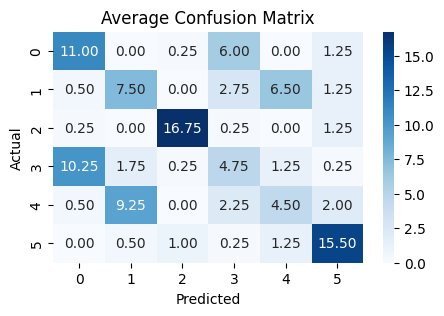


Model(Logistic Regression) using feature(Spec_Cent&BW) and feature reduction(PCA)



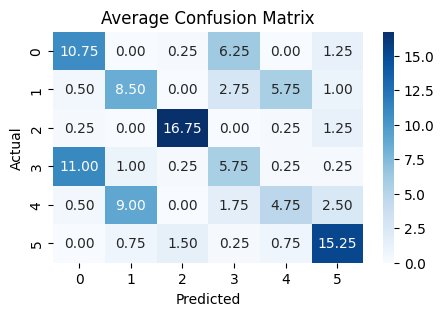


Model(Logistic Regression) using feature(Spec_Cent&BW) and feature reduction(None)



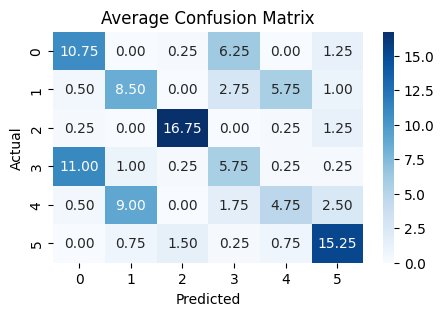


Model(Logistic Regression) using feature(all_features) and feature reduction(LDA)



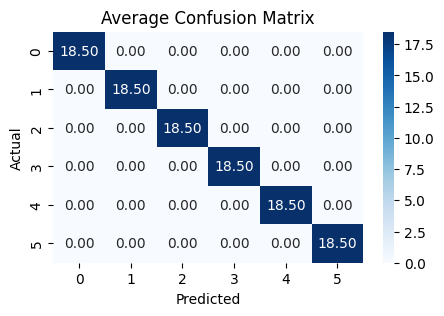


Model(Logistic Regression) using feature(all_features) and feature reduction(PCA)



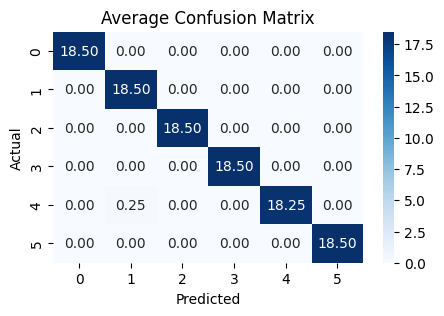


Model(Logistic Regression) using feature(all_features) and feature reduction(None)



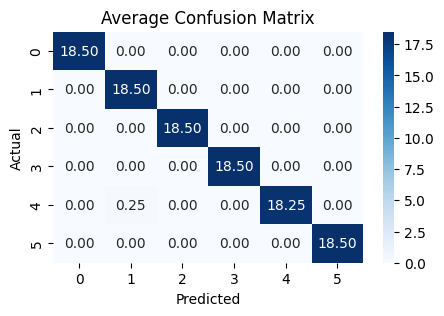


Model(SVM) using feature(time_domain_features) and feature reduction(LDA)



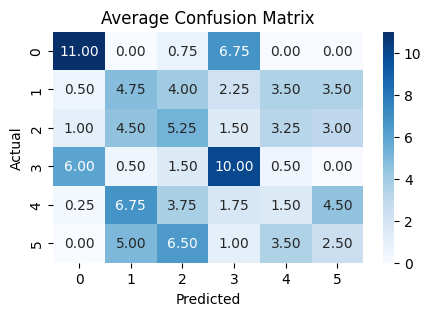


Model(SVM) using feature(time_domain_features) and feature reduction(PCA)



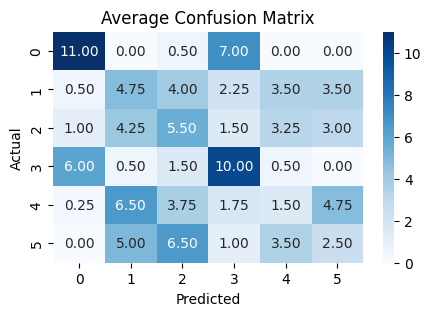


Model(SVM) using feature(time_domain_features) and feature reduction(None)



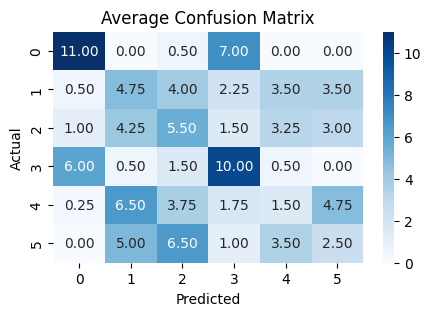


Model(SVM) using feature(MFCC) and feature reduction(LDA)



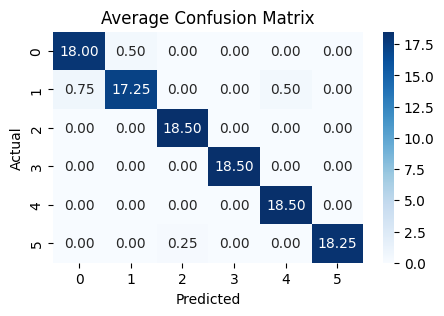


Model(SVM) using feature(MFCC) and feature reduction(PCA)



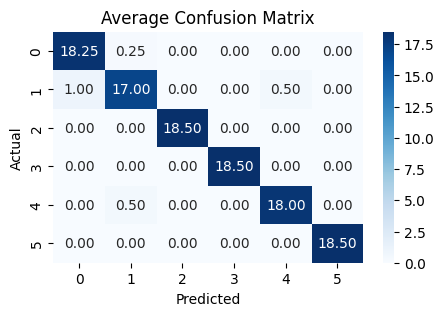


Model(SVM) using feature(MFCC) and feature reduction(None)



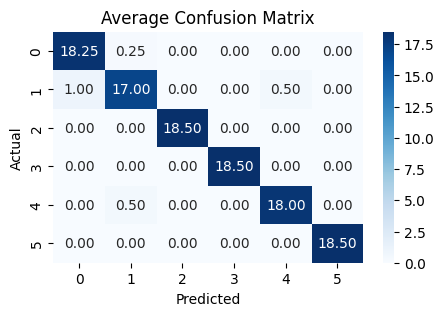


Model(SVM) using feature(Spectral Contrast) and feature reduction(LDA)



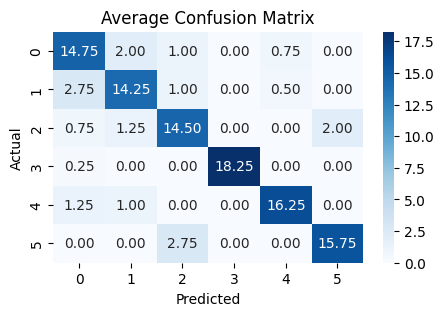


Model(SVM) using feature(Spectral Contrast) and feature reduction(PCA)



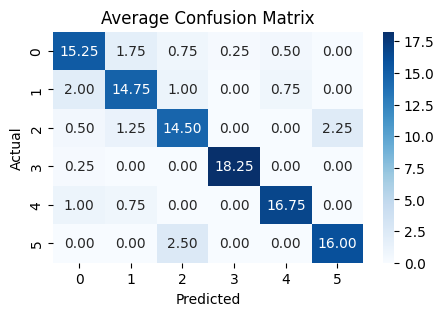


Model(SVM) using feature(Spectral Contrast) and feature reduction(None)



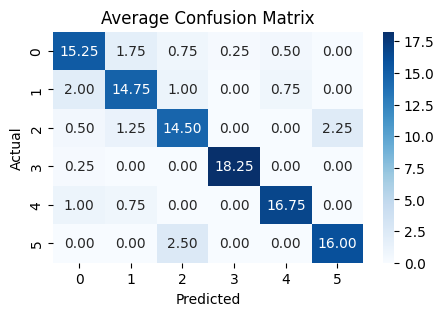


Model(SVM) using feature(MFCC&Sp_Contrast) and feature reduction(LDA)



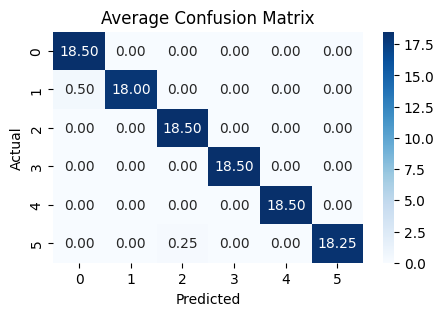


Model(SVM) using feature(MFCC&Sp_Contrast) and feature reduction(PCA)



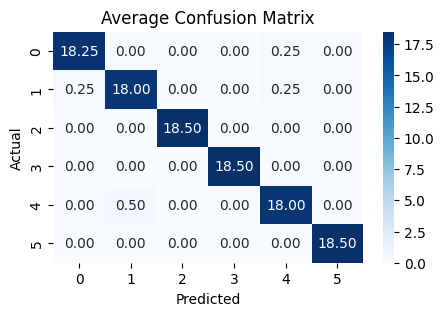


Model(SVM) using feature(MFCC&Sp_Contrast) and feature reduction(None)



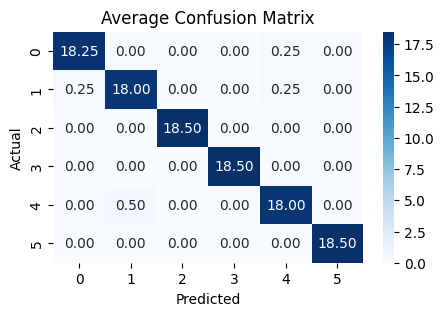


Model(SVM) using feature(Spec_Cent&BW) and feature reduction(LDA)



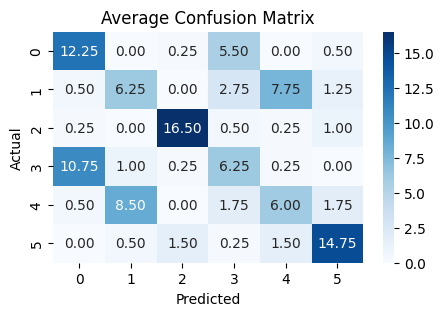


Model(SVM) using feature(Spec_Cent&BW) and feature reduction(PCA)



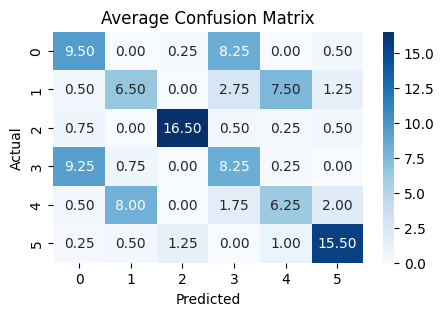


Model(SVM) using feature(Spec_Cent&BW) and feature reduction(None)



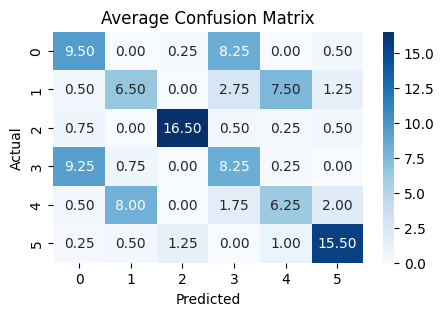


Model(SVM) using feature(all_features) and feature reduction(LDA)



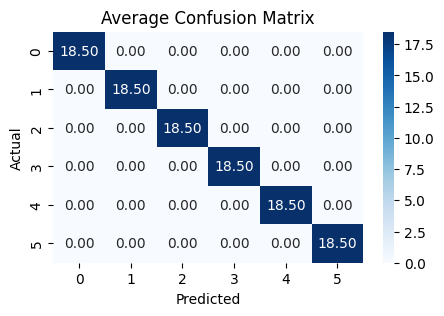


Model(SVM) using feature(all_features) and feature reduction(PCA)



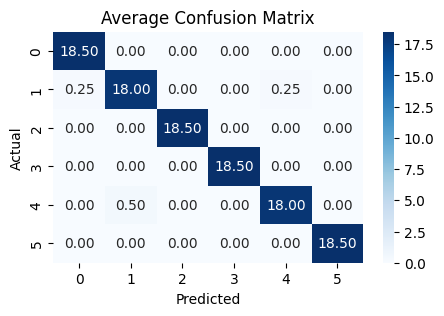


Model(SVM) using feature(all_features) and feature reduction(None)



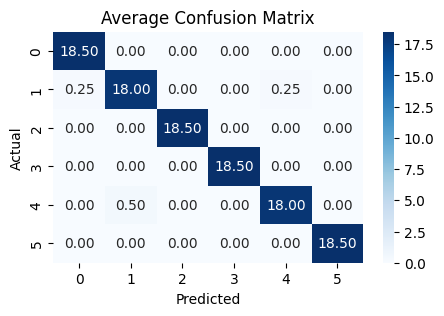

In [ ]:
Result_DF = Run_Classification(balanced_data)

#### **Sorting and Displaying Top Results**
By sorting the results DataFrame by mean accuracy and displaying the top rows, we efficiently identify the best-performing combinations of models, feature sets, and feature reduction techniques.

In [ ]:
df_sorted = Result_DF.sort_values(by='Mean Accuracy', ascending=False)
df_sorted.head()

,Model,Feature Set,Feature Reduction,Mean Accuracy,Std Accuracy
15,KNN,all_features,LDA,100.000000,0.000000
51,SVM,all_features,LDA,100.000000,0.000000
33,Logistic Regression,all_features,LDA,100.000000,0.000000
35,Logistic Regression,all_features,None,99.774775,0.390102
34,Logistic Regression,all_features,PCA,99.774775,0.390102


#### **Ploting Results**
The line Plot_Results_Barchart(Result_DF) calls the Plot_Results_Barchart function and passes the Result_DF DataFrame as an argument. This function generates and displays bar charts that visually compare the performance of various classification models and feature reduction techniques based on the cross-validation results stored in Result_DF.

Maximum accuracy if feature reduction(LDA): 100.00%


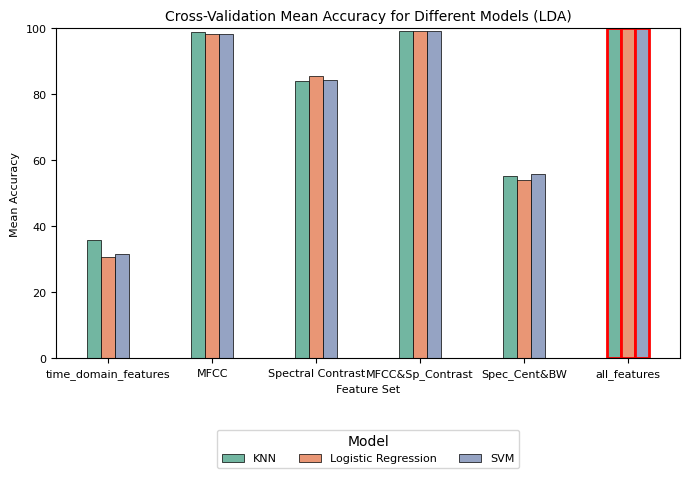

Maximum accuracy if feature reduction(PCA): 99.77%


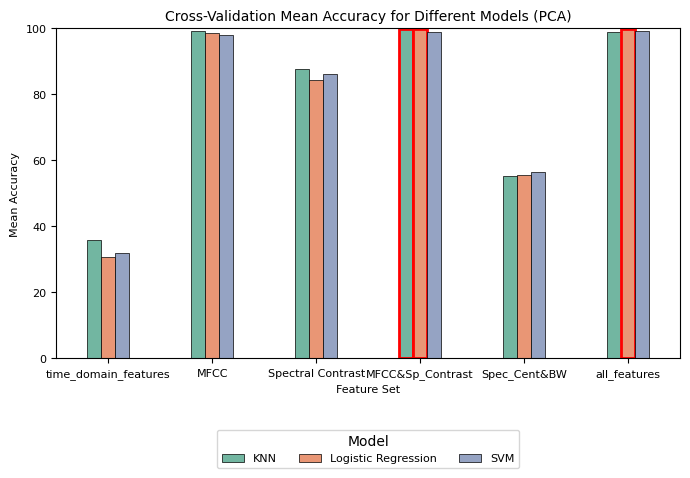

Maximum accuracy if feature reduction(None): 99.77%


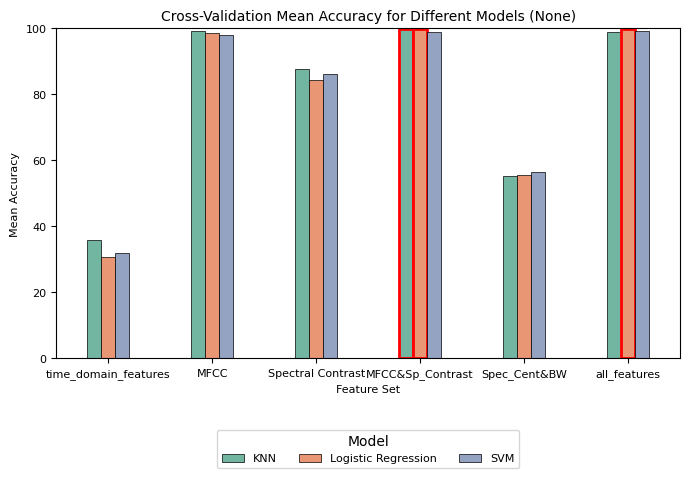

In [ ]:
Plot_Results_Barchart(Result_DF)

# Random Student Set2

In [ ]:
import random

random.seed(8)

# Get unique student IDs
student_ids = data['student_id'].unique()

# Randomly select 6 students
selected_students = random.sample(list(student_ids), 6)
print(f"Selected Students: {selected_students}")

Selected Students: [810102027, 810600065, 810103019, 810102032, 610399182, 810103172]


In [ ]:
from sklearn.utils import shuffle

filtered_data = data[data['student_id'].isin(selected_students)]

# Ensure each student has an equal number of samples
balanced_data = filtered_data.groupby('student_id').apply(lambda x: x.sample(n=filtered_data['student_id'].value_counts().min(), random_state=42)).reset_index(drop=True)
balanced_data = shuffle(balanced_data, random_state=42)
balanced_data.reset_index(drop=True, inplace=True)

print("Number of samples for each student in the balanced DataFrame:")
print(balanced_data['student_id'].value_counts())

Number of samples for each student in the balanced DataFrame:
student_id
810600065    312
810103019    312
810103172    312
610399182    312
810102027    312
810102032    312
Name: count, dtype: int64


<ipython-input-18-bbe0c27d918c>:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  balanced_data = filtered_data.groupby('student_id').apply(lambda x: x.sample(n=filtered_data['student_id'].value_counts().min(), random_state=42)).reset_index(drop=True)


## Classification and Analysis for Student Set2

In [ ]:
# Map student IDs to class labels (e.g., 0 to 5)
class_mapping = {student_id: idx for idx, student_id in enumerate(selected_students)}
balanced_data['class'] = balanced_data['student_id'].map(class_mapping)

print("Balanced DataFrame with Class Column:")
balanced_data.tail()

Balanced DataFrame with Class Column:


,filename,label,student_id,Mfcc_1,Mfcc_2,Mfcc_3,Mfcc_4,Mfcc_5,Mfcc_6,Mfcc_7,...,Spectral_Contrast_3,Spectral_Contrast_4,Spectral_Contrast_5,Spectral_Contrast_6,Spectral_Contrast_7,Zero_Crossing_Rate,RMS_Energy,Spectral_Centroid,Spectral_Bandwidth,class
1867,HW1_Q5_810103019_male.mp3_73,male,810103019,-187.743554,145.213314,-18.821650,25.365956,-17.604940,3.291142,-17.155144,...,19.895190,17.206410,19.012837,20.937225,57.518124,0.066243,0.184741,1288.687116,1461.760550,2
1868,HW1_Q5_810103172_MALE.mp3_55,male,810103172,-117.233313,130.103324,-10.577593,27.051287,-30.099192,4.512797,-35.654485,...,19.472818,16.806099,15.869729,15.158224,61.755750,0.079550,0.290558,1510.012160,1752.172769,5
1869,HW1_Q5_810102032_male.mp3_81,male,810102032,-249.981008,124.247315,13.297781,67.814404,10.654413,-9.992552,-33.053574,...,23.057657,18.444528,18.303887,19.174908,57.836265,0.055334,0.183580,1103.523029,1324.987895,3
1870,HW1_Q5_810103172_MALE.mp3_34,male,810103172,-151.736310,127.232143,-7.029347,38.718364,-42.658699,12.042099,-33.417148,...,19.138653,16.159731,15.165192,15.346748,65.320587,0.097535,0.165872,1695.042471,1899.896592,5
1871,HW1_Q3_810103019_male.mp3_4,male,810103019,-186.214361,129.623999,-3.824790,37.963551,-6.584885,1.359119,-15.559198,...,19.127759,16.138569,17.869713,20.706986,61.494332,0.069483,0.196414,1399.996048,1550.112825,2


### Classification Process and Average Confusion Matrix

#### **Calling the Classification Function**


Model(KNN) using feature(time_domain_features) and feature reduction(LDA)



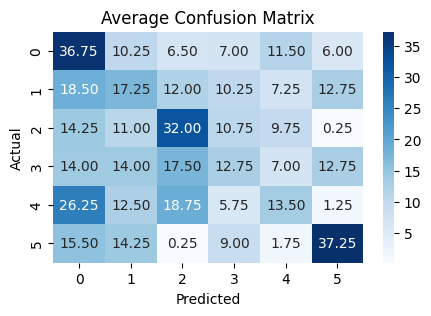


Model(KNN) using feature(time_domain_features) and feature reduction(PCA)



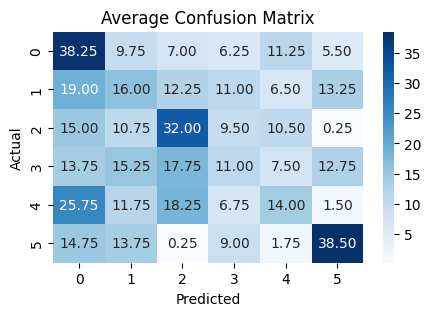


Model(KNN) using feature(time_domain_features) and feature reduction(None)



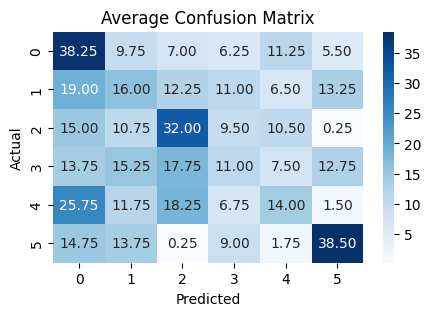


Model(KNN) using feature(MFCC) and feature reduction(LDA)



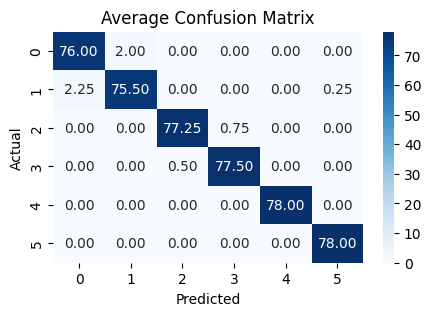


Model(KNN) using feature(MFCC) and feature reduction(PCA)



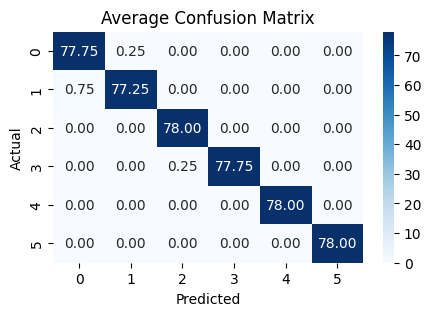


Model(KNN) using feature(MFCC) and feature reduction(None)



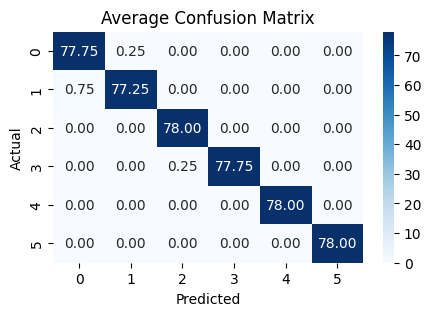


Model(KNN) using feature(Spectral Contrast) and feature reduction(LDA)



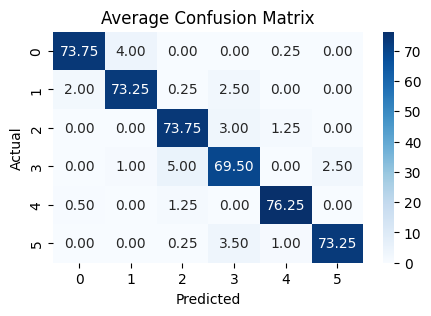


Model(KNN) using feature(Spectral Contrast) and feature reduction(PCA)



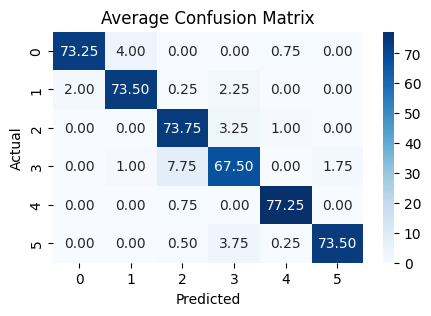


Model(KNN) using feature(Spectral Contrast) and feature reduction(None)



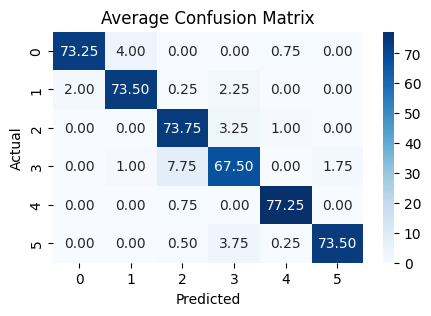


Model(KNN) using feature(MFCC&Sp_Contrast) and feature reduction(LDA)



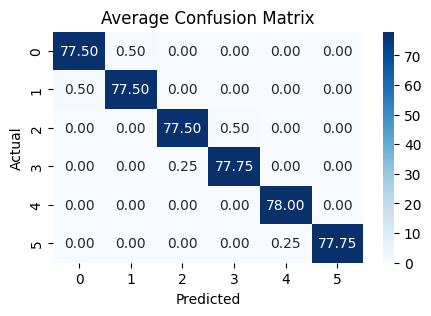


Model(KNN) using feature(MFCC&Sp_Contrast) and feature reduction(PCA)



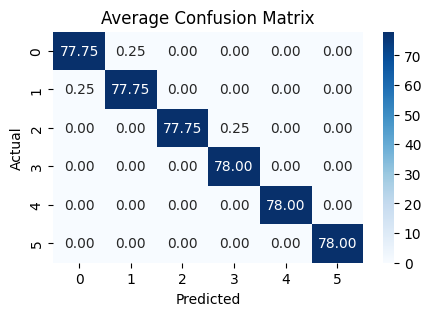


Model(KNN) using feature(MFCC&Sp_Contrast) and feature reduction(None)



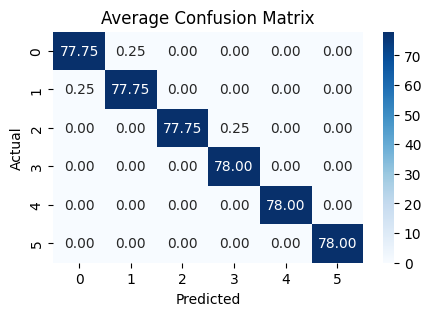


Model(KNN) using feature(Spec_Cent&BW) and feature reduction(LDA)



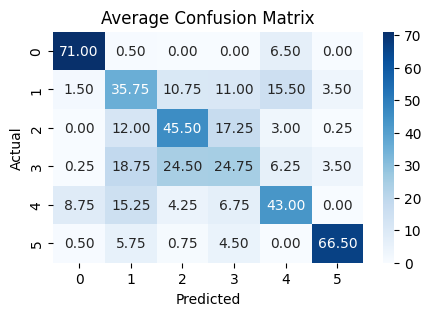


Model(KNN) using feature(Spec_Cent&BW) and feature reduction(PCA)



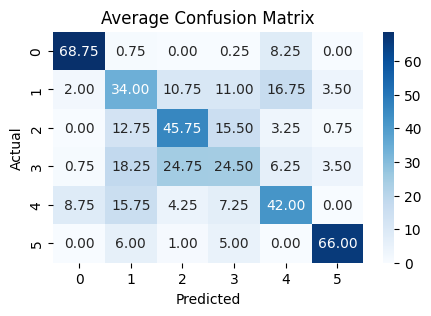


Model(KNN) using feature(Spec_Cent&BW) and feature reduction(None)



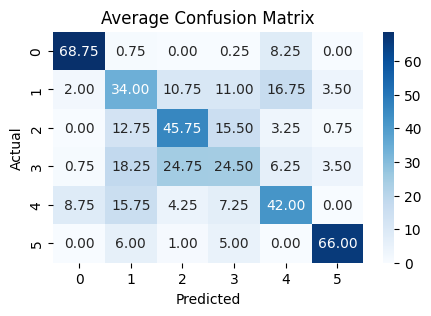


Model(KNN) using feature(all_features) and feature reduction(LDA)



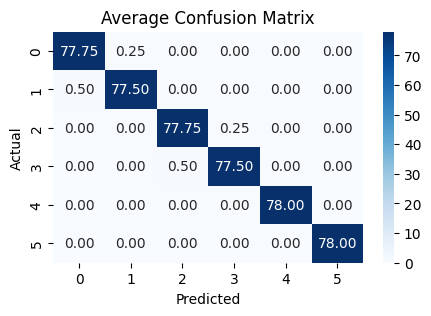


Model(KNN) using feature(all_features) and feature reduction(PCA)



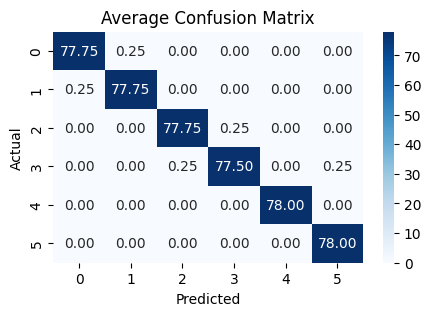


Model(KNN) using feature(all_features) and feature reduction(None)



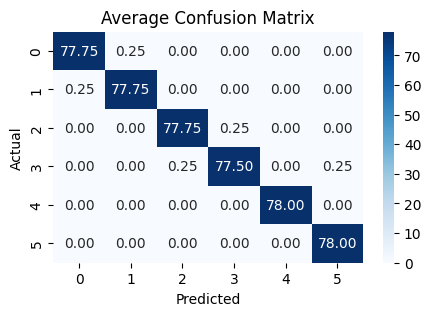


Model(Logistic Regression) using feature(time_domain_features) and feature reduction(LDA)



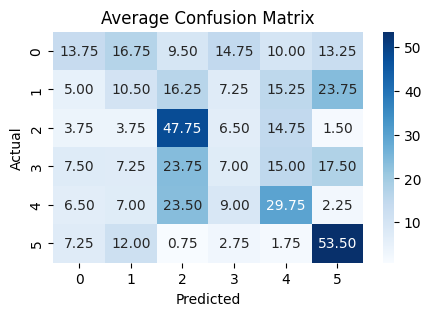


Model(Logistic Regression) using feature(time_domain_features) and feature reduction(PCA)



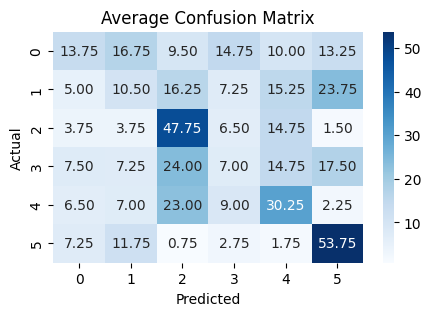


Model(Logistic Regression) using feature(time_domain_features) and feature reduction(None)



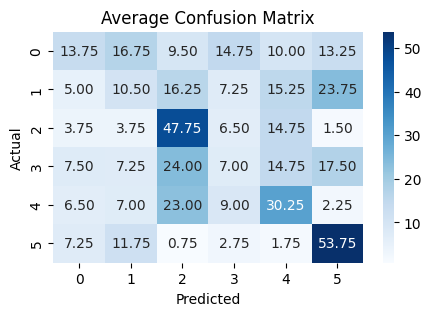


Model(Logistic Regression) using feature(MFCC) and feature reduction(LDA)



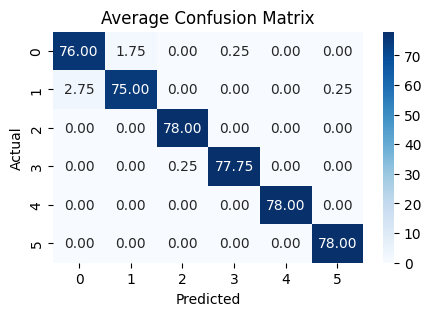


Model(Logistic Regression) using feature(MFCC) and feature reduction(PCA)



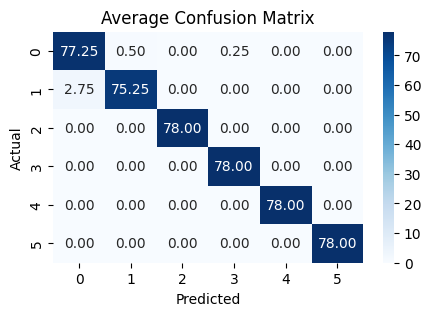


Model(Logistic Regression) using feature(MFCC) and feature reduction(None)



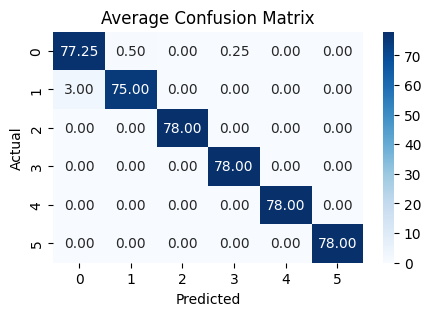


Model(Logistic Regression) using feature(Spectral Contrast) and feature reduction(LDA)



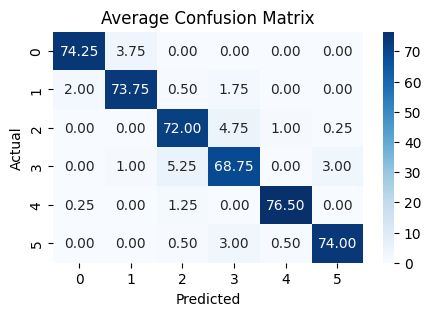


Model(Logistic Regression) using feature(Spectral Contrast) and feature reduction(PCA)



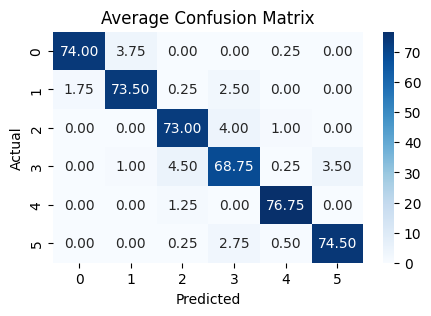


Model(Logistic Regression) using feature(Spectral Contrast) and feature reduction(None)



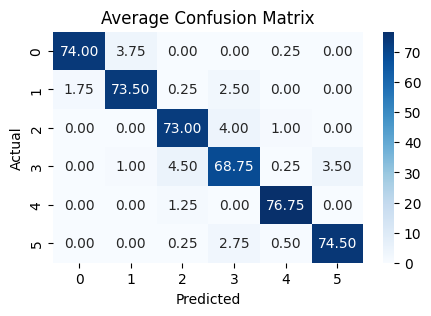


Model(Logistic Regression) using feature(MFCC&Sp_Contrast) and feature reduction(LDA)



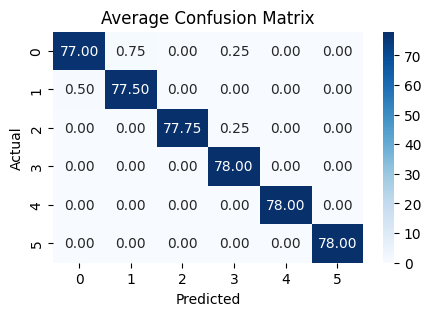


Model(Logistic Regression) using feature(MFCC&Sp_Contrast) and feature reduction(PCA)



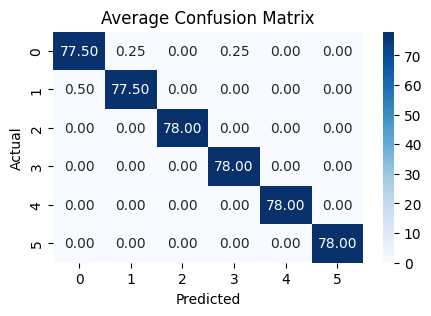


Model(Logistic Regression) using feature(MFCC&Sp_Contrast) and feature reduction(None)



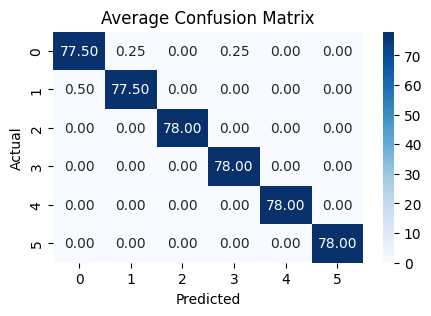


Model(Logistic Regression) using feature(Spec_Cent&BW) and feature reduction(LDA)



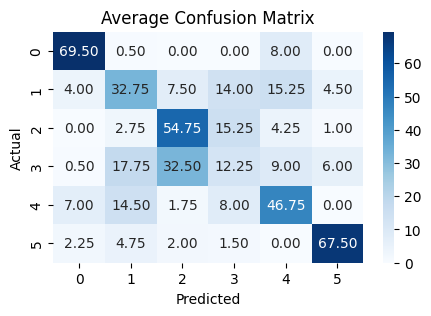


Model(Logistic Regression) using feature(Spec_Cent&BW) and feature reduction(PCA)



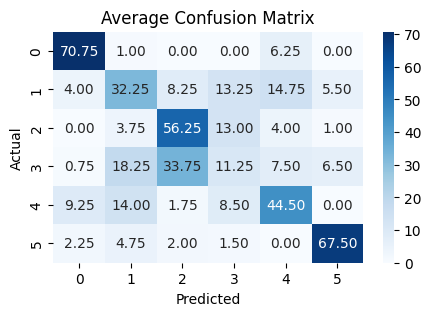


Model(Logistic Regression) using feature(Spec_Cent&BW) and feature reduction(None)



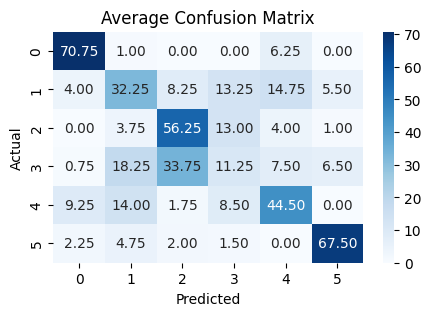


Model(Logistic Regression) using feature(all_features) and feature reduction(LDA)



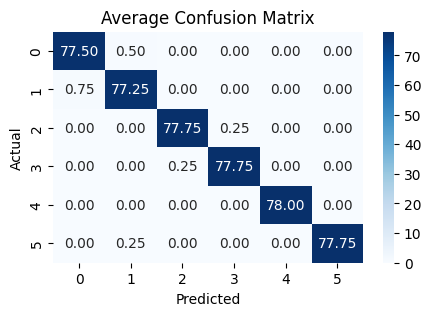


Model(Logistic Regression) using feature(all_features) and feature reduction(PCA)



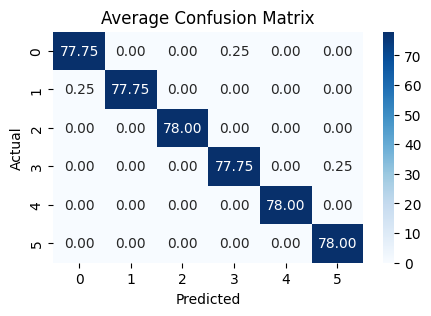


Model(Logistic Regression) using feature(all_features) and feature reduction(None)



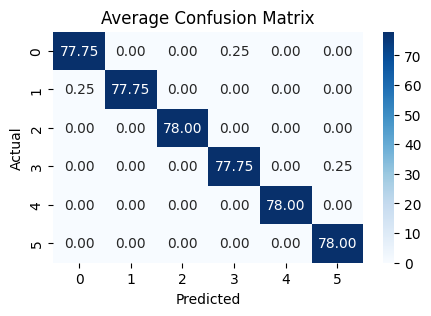


Model(SVM) using feature(time_domain_features) and feature reduction(LDA)



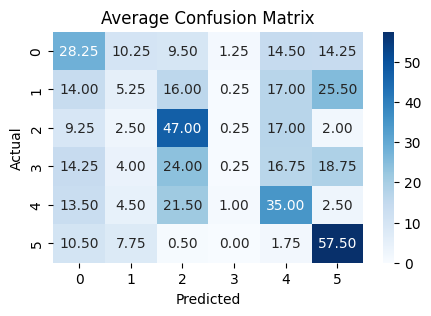


Model(SVM) using feature(time_domain_features) and feature reduction(PCA)



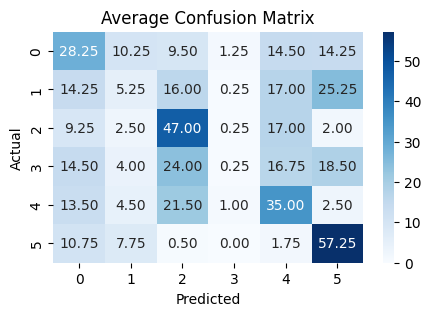


Model(SVM) using feature(time_domain_features) and feature reduction(None)



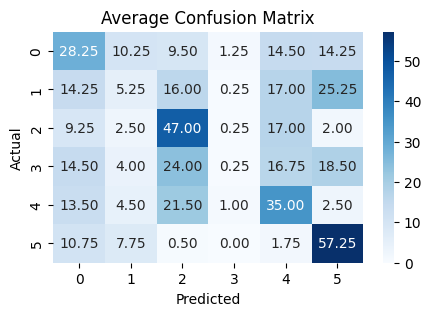


Model(SVM) using feature(MFCC) and feature reduction(LDA)



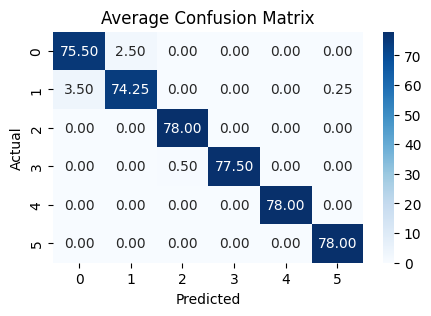


Model(SVM) using feature(MFCC) and feature reduction(PCA)



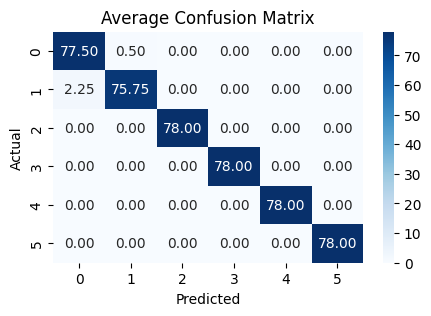


Model(SVM) using feature(MFCC) and feature reduction(None)



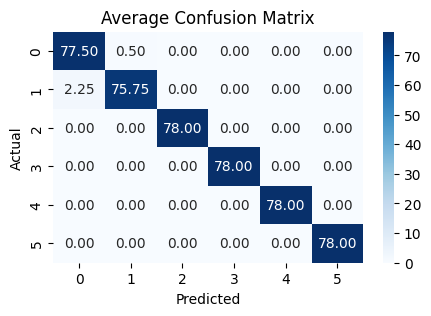


Model(SVM) using feature(Spectral Contrast) and feature reduction(LDA)



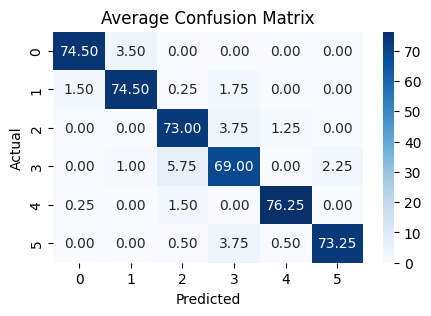


Model(SVM) using feature(Spectral Contrast) and feature reduction(PCA)



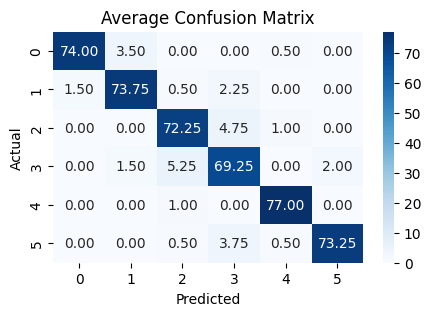


Model(SVM) using feature(Spectral Contrast) and feature reduction(None)



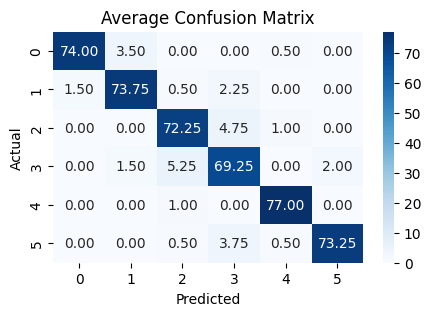


Model(SVM) using feature(MFCC&Sp_Contrast) and feature reduction(LDA)



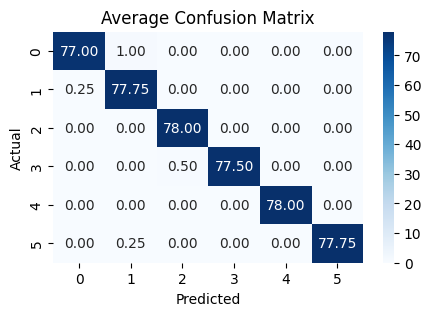


Model(SVM) using feature(MFCC&Sp_Contrast) and feature reduction(PCA)



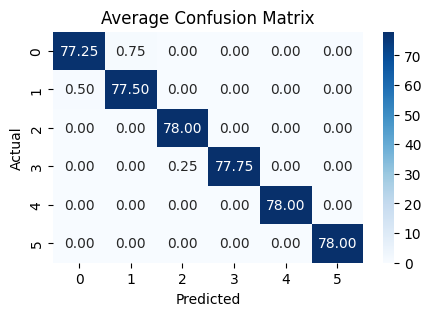


Model(SVM) using feature(MFCC&Sp_Contrast) and feature reduction(None)



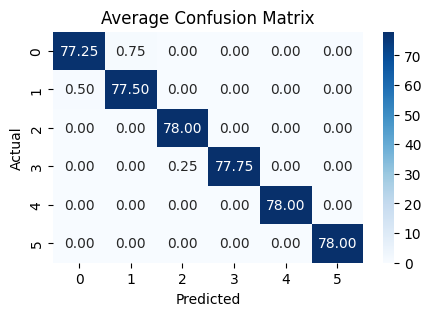


Model(SVM) using feature(Spec_Cent&BW) and feature reduction(LDA)



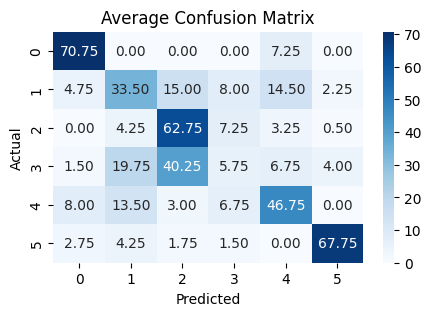


Model(SVM) using feature(Spec_Cent&BW) and feature reduction(PCA)



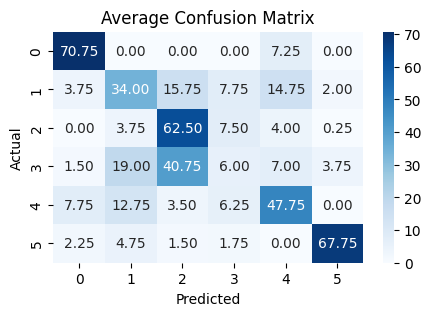


Model(SVM) using feature(Spec_Cent&BW) and feature reduction(None)



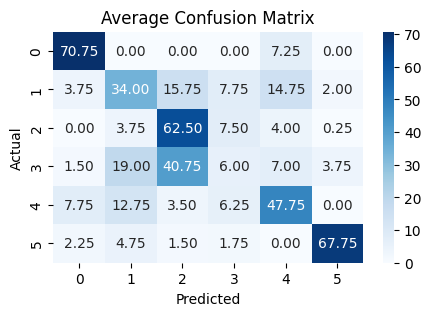


Model(SVM) using feature(all_features) and feature reduction(LDA)



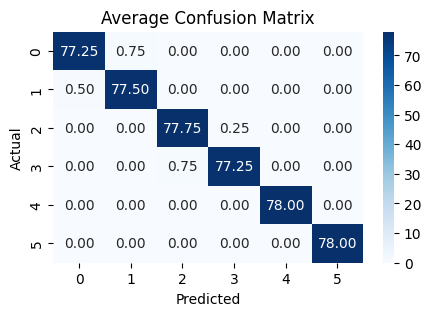


Model(SVM) using feature(all_features) and feature reduction(PCA)



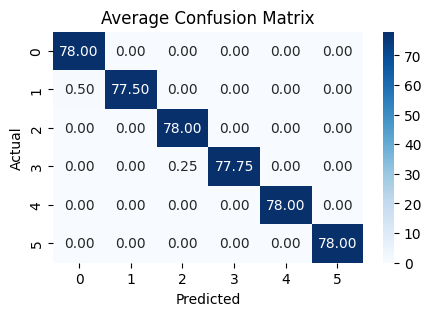


Model(SVM) using feature(all_features) and feature reduction(None)



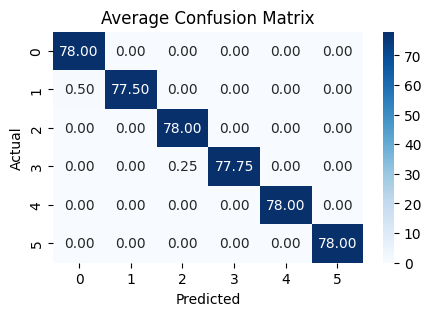

In [ ]:
Result_DF = Run_Classification(balanced_data)

#### **Sorting and displaying Top Results**

In [ ]:
df_sorted = Result_DF.sort_values(by='Mean Accuracy', ascending=False)
df_sorted.head()

,Model,Feature Set,Feature Reduction,Mean Accuracy,Std Accuracy
53,SVM,all_features,None,99.839744,0.092524
52,SVM,all_features,PCA,99.839744,0.092524
35,Logistic Regression,all_features,None,99.839744,0.177170
34,Logistic Regression,all_features,PCA,99.839744,0.177170
10,KNN,MFCC&Sp_Contrast,PCA,99.839744,0.177170


#### **Ploting Results**

Maximum accuracy if feature reduction(LDA): 99.68%


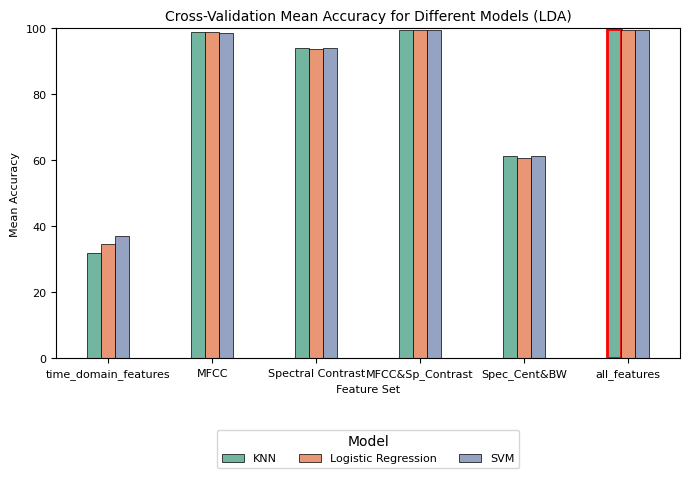

Maximum accuracy if feature reduction(PCA): 99.84%


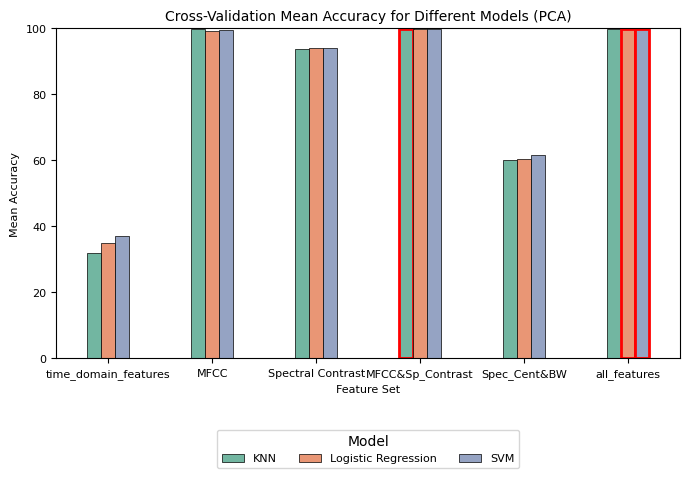

Maximum accuracy if feature reduction(None): 99.84%


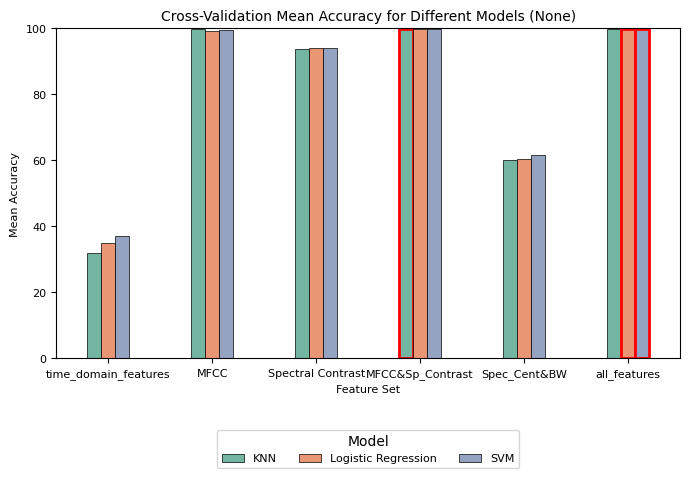

In [ ]:
Plot_Results_Barchart(Result_DF)

# Random Student Set3

In [ ]:
import random

random.seed(1403)

# Get unique student IDs
student_ids = data['student_id'].unique()

# Randomly select 6 students
selected_students = random.sample(list(student_ids), 6)
print(f"Selected Students: {selected_students}")

Selected Students: [810100193, 810100168, 810102032, 810102142, 810102029, 810103123]


In [ ]:
from sklearn.utils import shuffle

filtered_data = data[data['student_id'].isin(selected_students)]

# Ensure each student has an equal number of samples
balanced_data = filtered_data.groupby('student_id').apply(lambda x: x.sample(n=filtered_data['student_id'].value_counts().min(), random_state=42)).reset_index(drop=True)
balanced_data = shuffle(balanced_data, random_state=42)
balanced_data.reset_index(drop=True, inplace=True)

print("Number of samples for each student in the balanced DataFrame:")
print(balanced_data['student_id'].value_counts())

Number of samples for each student in the balanced DataFrame:
student_id
810102032    178
810100193    178
810102142    178
810100168    178
810102029    178
810103123    178
Name: count, dtype: int64


<ipython-input-24-bbe0c27d918c>:6: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  balanced_data = filtered_data.groupby('student_id').apply(lambda x: x.sample(n=filtered_data['student_id'].value_counts().min(), random_state=42)).reset_index(drop=True)


## Classification and Analysis for Student Set3

In [ ]:
# Map student IDs to class labels (e.g., 0 to 5)
class_mapping = {student_id: idx for idx, student_id in enumerate(selected_students)}
balanced_data['class'] = balanced_data['student_id'].map(class_mapping)

print("Balanced DataFrame with Class Column:")
balanced_data.tail()

Balanced DataFrame with Class Column:


,filename,label,student_id,Mfcc_1,Mfcc_2,Mfcc_3,Mfcc_4,Mfcc_5,Mfcc_6,Mfcc_7,...,Spectral_Contrast_3,Spectral_Contrast_4,Spectral_Contrast_5,Spectral_Contrast_6,Spectral_Contrast_7,Zero_Crossing_Rate,RMS_Energy,Spectral_Centroid,Spectral_Bandwidth,class
1063,HW1_Q3_810100193_female.mp3_20,female,810100193,-185.857146,138.037257,-7.590984,57.695194,-22.400884,-13.870632,-38.870288,...,19.815696,17.248748,18.342700,18.163670,59.026619,0.047739,0.214144,1203.517124,1444.926131,0
1064,HW1_Q4_810102029_male.mp3_70,male,810102029,-232.085505,171.201617,-1.260950,5.811268,-0.418614,18.330294,-15.384661,...,18.572296,16.320943,19.108107,15.267249,55.221378,0.035165,0.139170,854.682729,1203.039173,4
1065,HW1_Q6_810100168_female.mp3_54,female,810100168,-223.647510,143.793790,-22.698824,-4.838051,-15.849336,-26.477324,-22.943366,...,19.976533,19.223231,19.750956,20.410100,57.749593,0.088187,0.146422,1314.364584,1160.321597,1
1066,HW1_Q6_810103123_female.mp3_3,female,810103123,-166.553480,122.222319,-41.963072,18.789638,-40.225231,-21.811205,-35.390004,...,22.725984,20.432552,20.209783,23.837595,64.942033,0.069090,0.255689,1477.639216,1489.204518,5
1067,HW1_Q1_810102142_male.mp3_5,male,810102142,-265.976675,127.656042,5.916821,27.992723,13.272203,7.348199,1.845801,...,22.890690,20.807028,24.031934,24.785823,52.357077,0.061659,0.206758,1048.168357,1013.298766,3


### Classification Process and Average Confusion Matrix

#### **Calling the Classification Function**


Model(KNN) using feature(time_domain_features) and feature reduction(LDA)



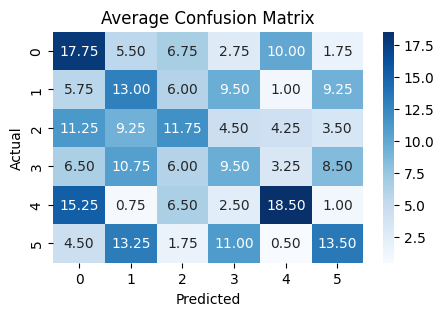


Model(KNN) using feature(time_domain_features) and feature reduction(PCA)



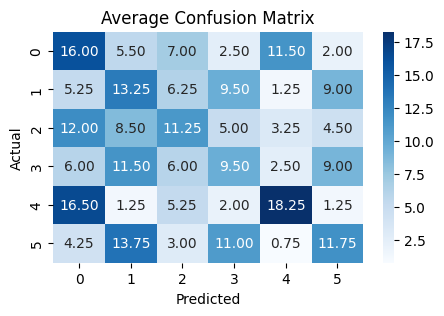


Model(KNN) using feature(time_domain_features) and feature reduction(None)



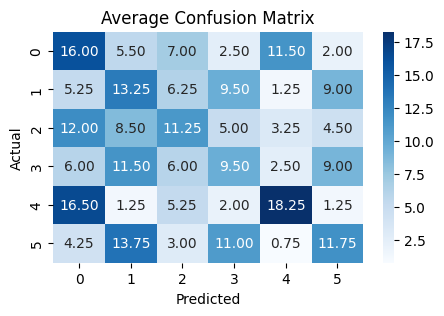


Model(KNN) using feature(MFCC) and feature reduction(LDA)



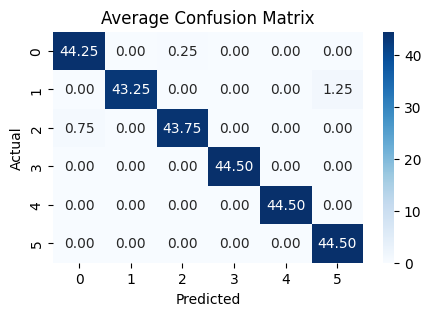


Model(KNN) using feature(MFCC) and feature reduction(PCA)



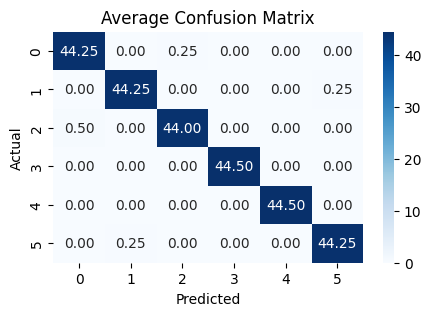


Model(KNN) using feature(MFCC) and feature reduction(None)



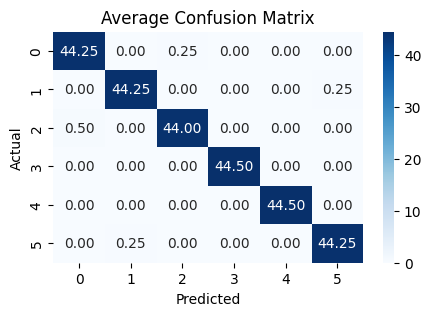


Model(KNN) using feature(Spectral Contrast) and feature reduction(LDA)



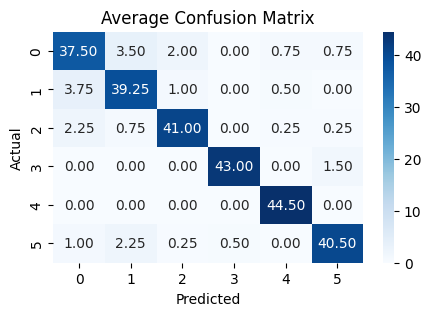


Model(KNN) using feature(Spectral Contrast) and feature reduction(PCA)



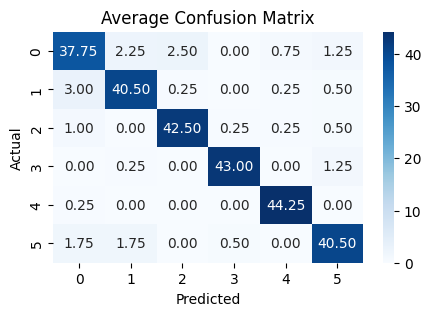


Model(KNN) using feature(Spectral Contrast) and feature reduction(None)



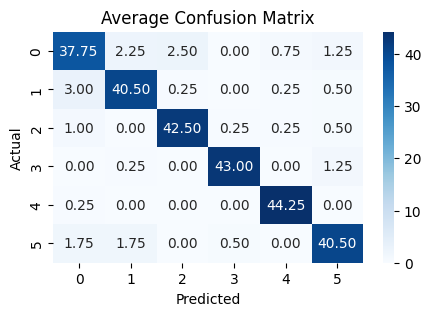


Model(KNN) using feature(MFCC&Sp_Contrast) and feature reduction(LDA)



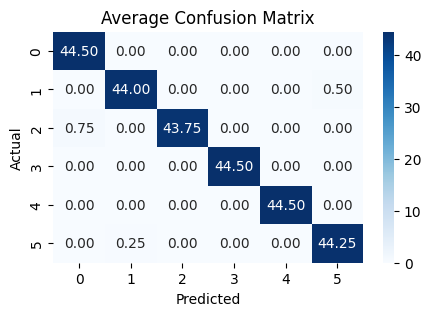


Model(KNN) using feature(MFCC&Sp_Contrast) and feature reduction(PCA)



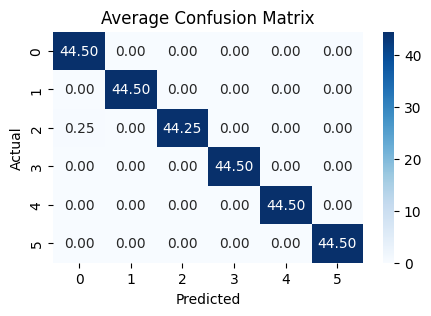


Model(KNN) using feature(MFCC&Sp_Contrast) and feature reduction(None)



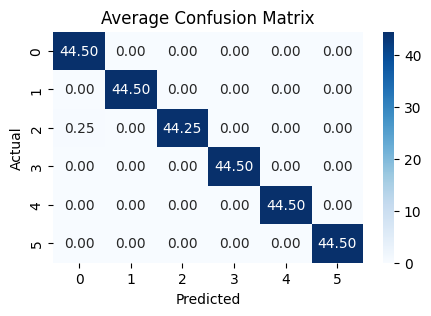


Model(KNN) using feature(Spec_Cent&BW) and feature reduction(LDA)



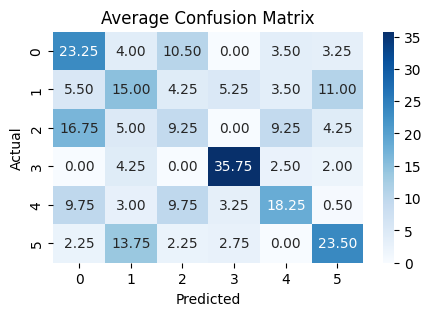


Model(KNN) using feature(Spec_Cent&BW) and feature reduction(PCA)



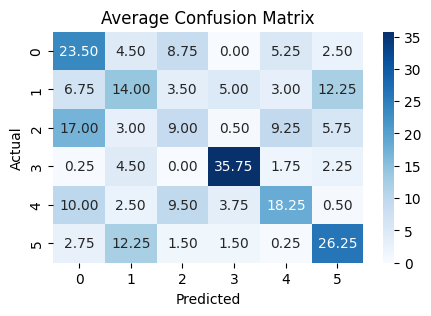


Model(KNN) using feature(Spec_Cent&BW) and feature reduction(None)



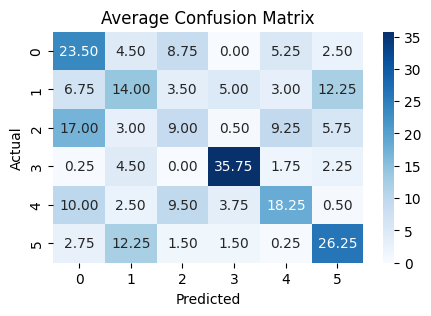


Model(KNN) using feature(all_features) and feature reduction(LDA)



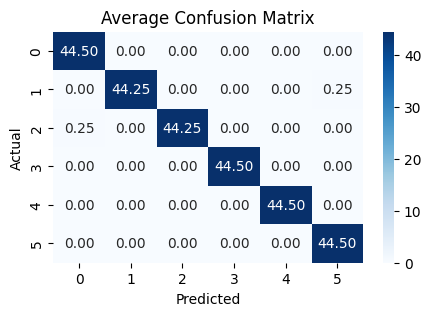


Model(KNN) using feature(all_features) and feature reduction(PCA)



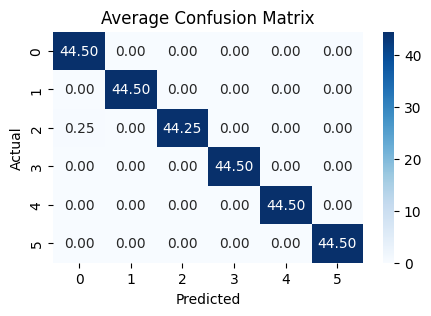


Model(KNN) using feature(all_features) and feature reduction(None)



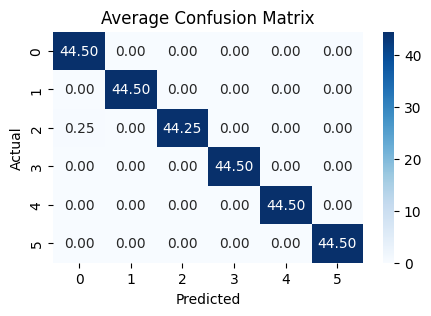


Model(Logistic Regression) using feature(time_domain_features) and feature reduction(LDA)



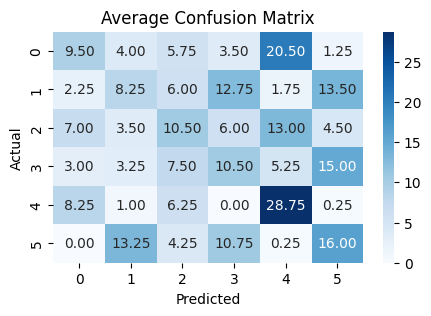


Model(Logistic Regression) using feature(time_domain_features) and feature reduction(PCA)



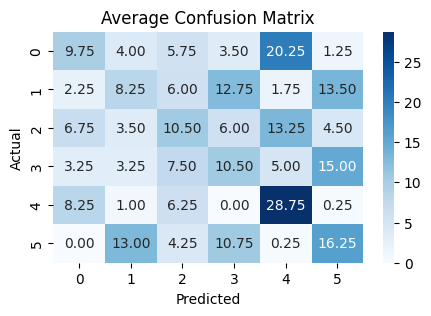


Model(Logistic Regression) using feature(time_domain_features) and feature reduction(None)



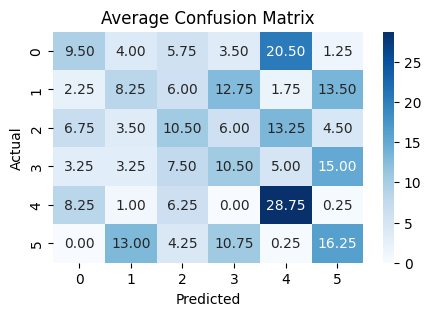


Model(Logistic Regression) using feature(MFCC) and feature reduction(LDA)



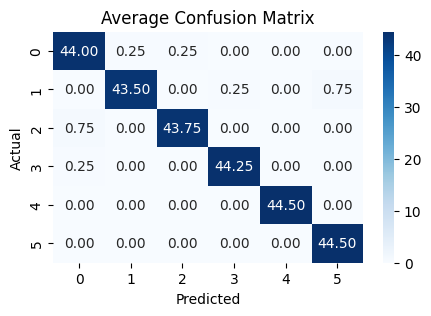


Model(Logistic Regression) using feature(MFCC) and feature reduction(PCA)



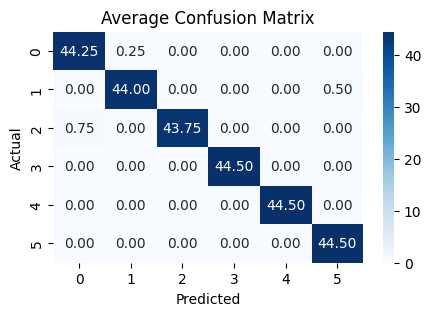


Model(Logistic Regression) using feature(MFCC) and feature reduction(None)



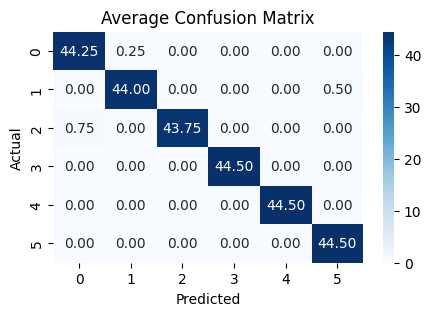


Model(Logistic Regression) using feature(Spectral Contrast) and feature reduction(LDA)



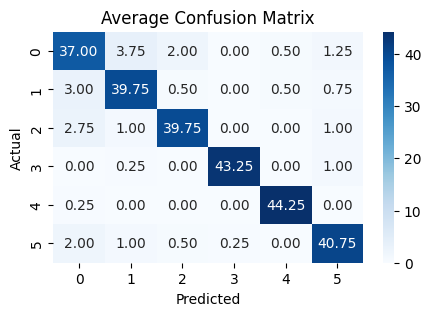


Model(Logistic Regression) using feature(Spectral Contrast) and feature reduction(PCA)



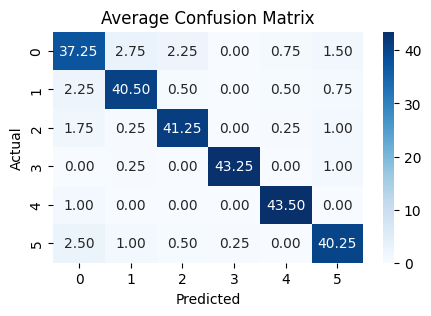


Model(Logistic Regression) using feature(Spectral Contrast) and feature reduction(None)



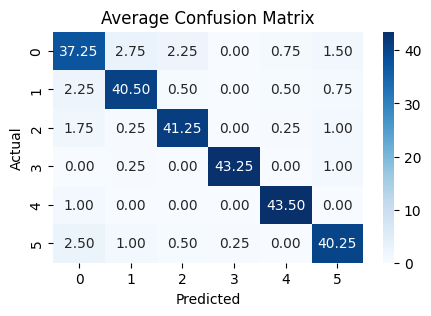


Model(Logistic Regression) using feature(MFCC&Sp_Contrast) and feature reduction(LDA)



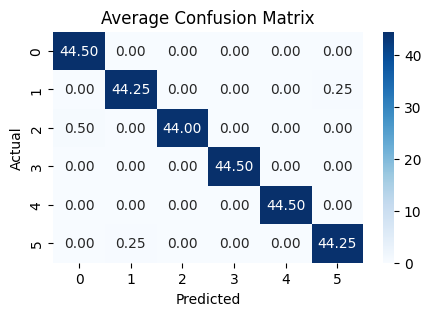


Model(Logistic Regression) using feature(MFCC&Sp_Contrast) and feature reduction(PCA)



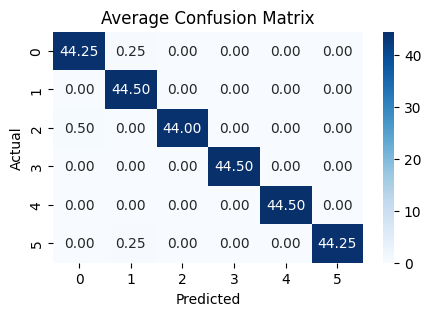


Model(Logistic Regression) using feature(MFCC&Sp_Contrast) and feature reduction(None)



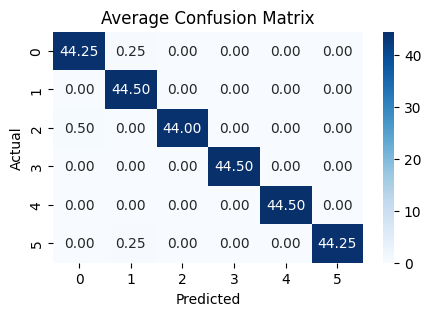


Model(Logistic Regression) using feature(Spec_Cent&BW) and feature reduction(LDA)



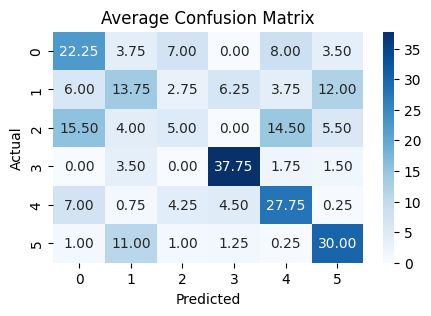


Model(Logistic Regression) using feature(Spec_Cent&BW) and feature reduction(PCA)



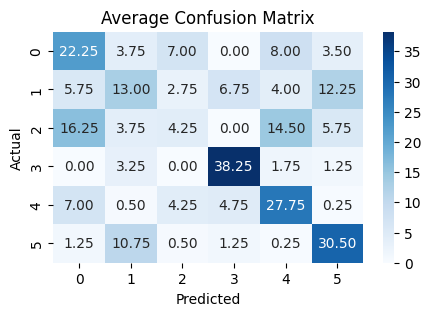


Model(Logistic Regression) using feature(Spec_Cent&BW) and feature reduction(None)



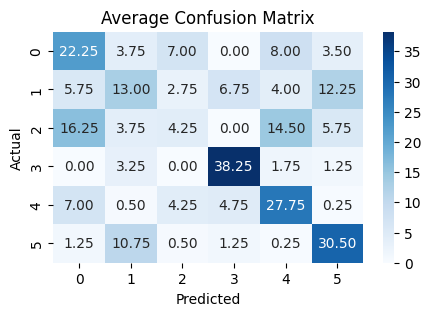


Model(Logistic Regression) using feature(all_features) and feature reduction(LDA)



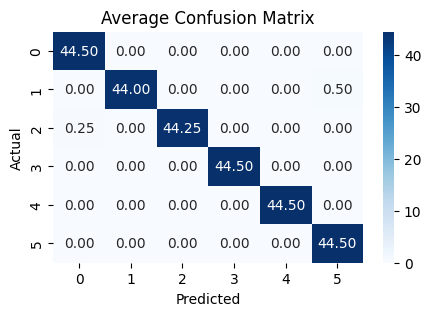


Model(Logistic Regression) using feature(all_features) and feature reduction(PCA)



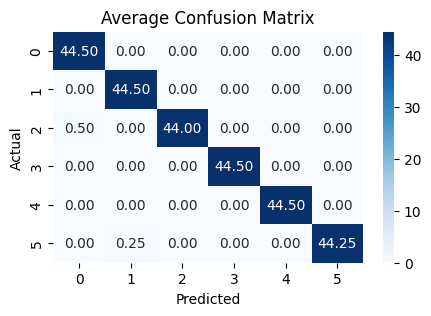


Model(Logistic Regression) using feature(all_features) and feature reduction(None)



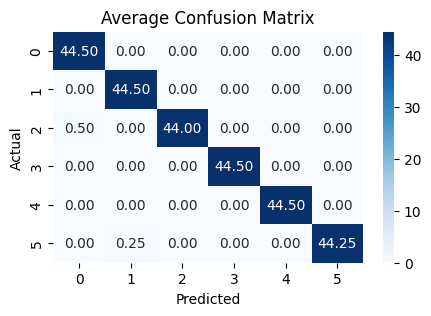


Model(SVM) using feature(time_domain_features) and feature reduction(LDA)



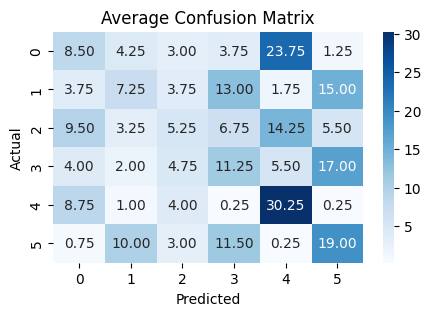


Model(SVM) using feature(time_domain_features) and feature reduction(PCA)



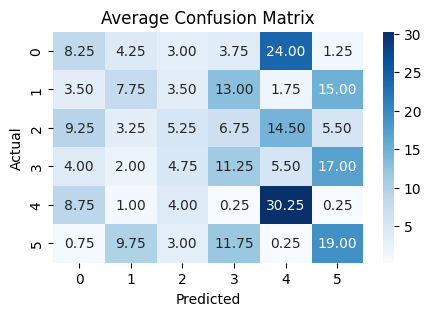


Model(SVM) using feature(time_domain_features) and feature reduction(None)



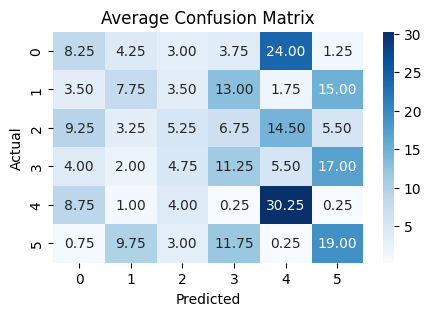


Model(SVM) using feature(MFCC) and feature reduction(LDA)



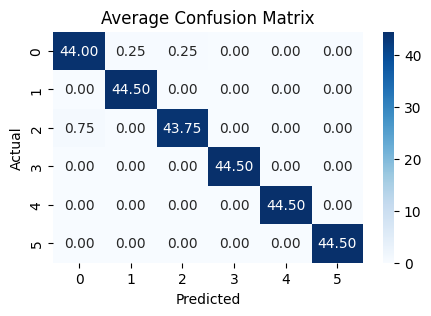


Model(SVM) using feature(MFCC) and feature reduction(PCA)



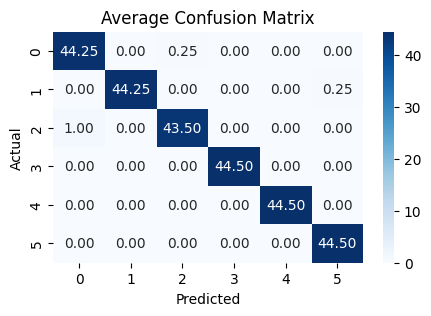


Model(SVM) using feature(MFCC) and feature reduction(None)



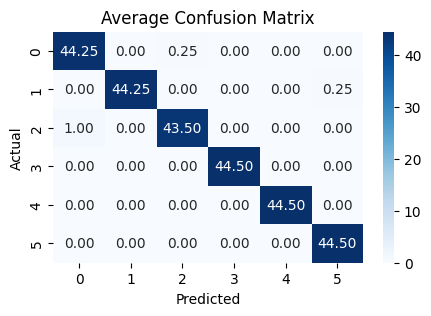


Model(SVM) using feature(Spectral Contrast) and feature reduction(LDA)



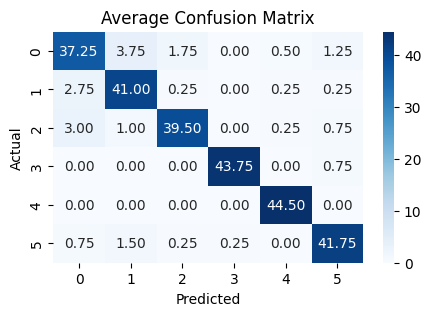


Model(SVM) using feature(Spectral Contrast) and feature reduction(PCA)



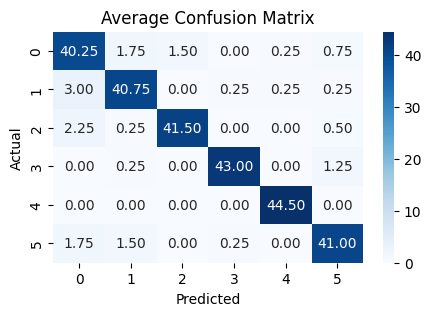


Model(SVM) using feature(Spectral Contrast) and feature reduction(None)



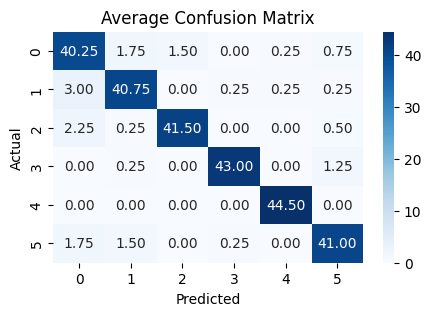


Model(SVM) using feature(MFCC&Sp_Contrast) and feature reduction(LDA)



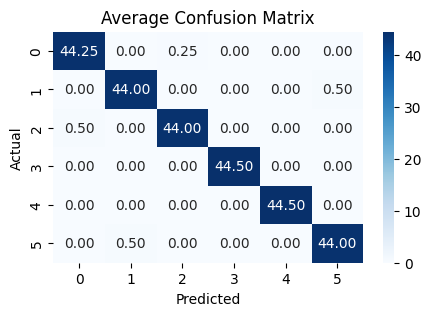


Model(SVM) using feature(MFCC&Sp_Contrast) and feature reduction(PCA)



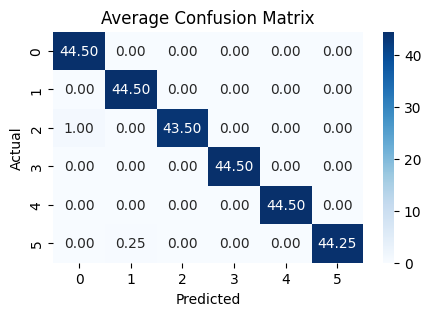


Model(SVM) using feature(MFCC&Sp_Contrast) and feature reduction(None)



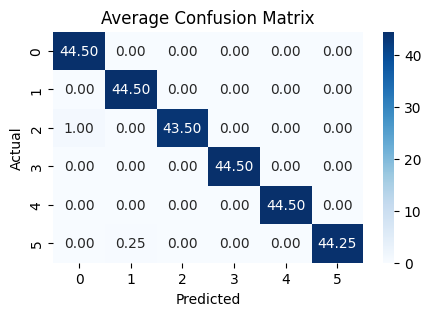


Model(SVM) using feature(Spec_Cent&BW) and feature reduction(LDA)



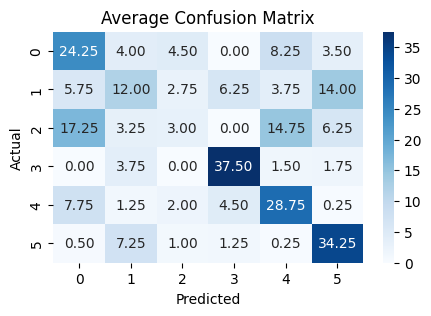


Model(SVM) using feature(Spec_Cent&BW) and feature reduction(PCA)



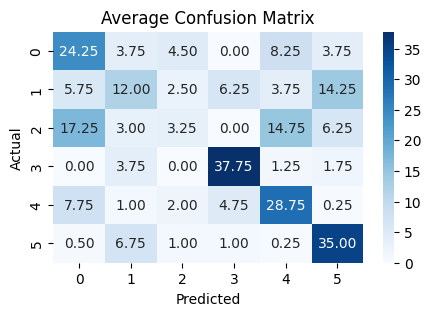


Model(SVM) using feature(Spec_Cent&BW) and feature reduction(None)



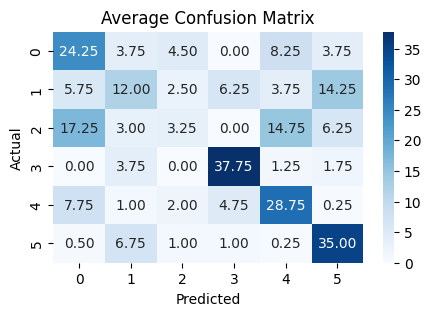


Model(SVM) using feature(all_features) and feature reduction(LDA)



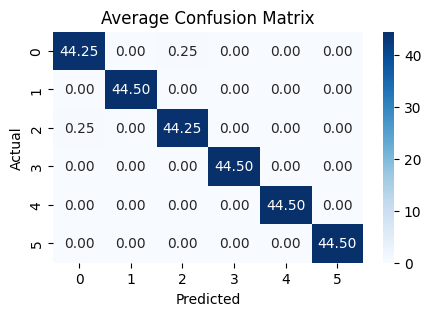


Model(SVM) using feature(all_features) and feature reduction(PCA)



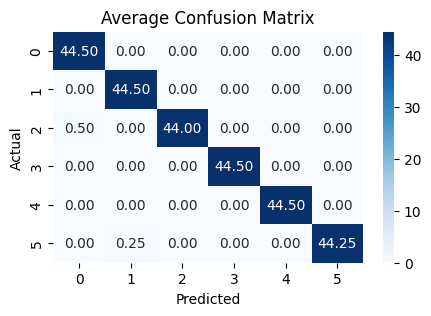


Model(SVM) using feature(all_features) and feature reduction(None)



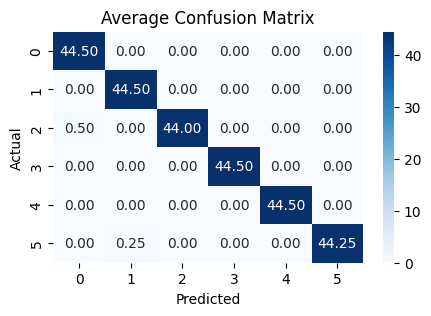

In [ ]:
Result_DF = Run_Classification(balanced_data)

#### **Sorting and displaying Top Results**

In [ ]:
df_sorted = Result_DF.sort_values(by='Mean Accuracy', ascending=False)
df_sorted.head()

,Model,Feature Set,Feature Reduction,Mean Accuracy,Std Accuracy
17,KNN,all_features,None,99.906367,0.162177
10,KNN,MFCC&Sp_Contrast,PCA,99.906367,0.162177
11,KNN,MFCC&Sp_Contrast,None,99.906367,0.162177
16,KNN,all_features,PCA,99.906367,0.162177
51,SVM,all_features,LDA,99.812734,0.187266


#### **Ploting Results**

Maximum accuracy if feature reduction(LDA): 99.81%


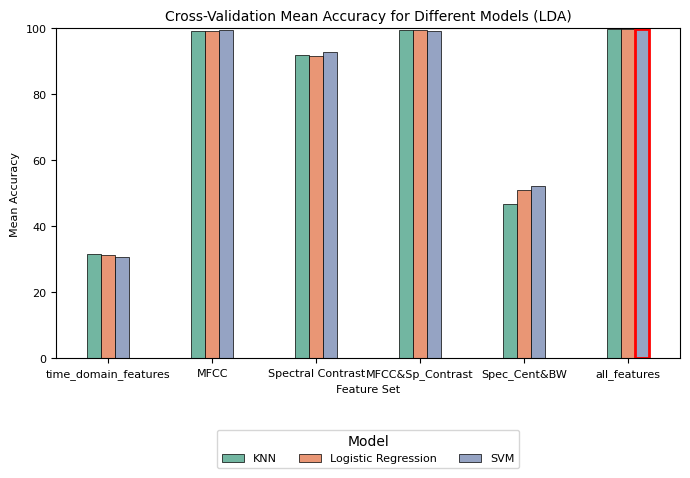

Maximum accuracy if feature reduction(PCA): 99.91%


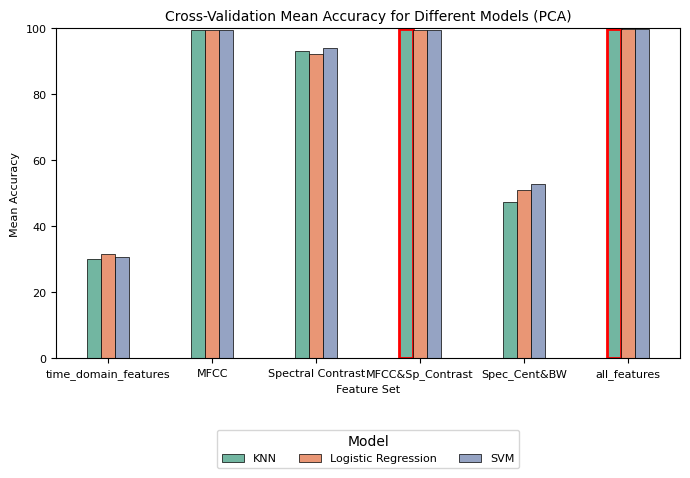

Maximum accuracy if feature reduction(None): 99.91%


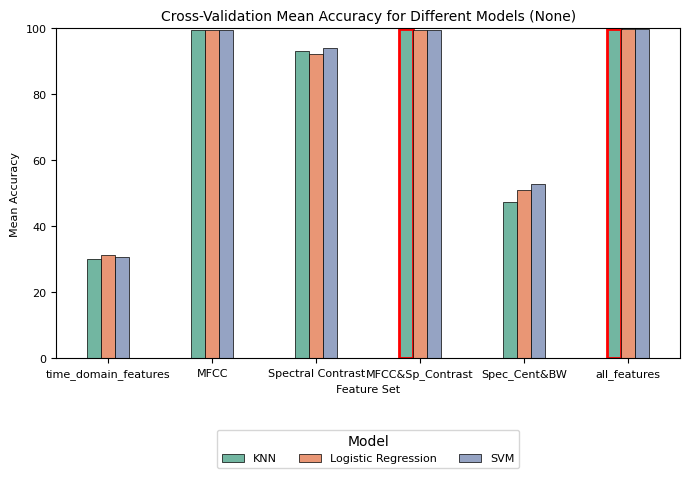

In [ ]:
Plot_Results_Barchart(Result_DF)